<a href="https://colab.research.google.com/github/silvjunu/devowel/blob/main/devowel_repaired.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# DeVowel

DeVowel is an experimental voice-synthesis project investigating whether vowel-dependent articulation can be reduced while preserving a reusable human-voice carrier.

The current dataset contains sustained recordings of:

- /a/
- /e/
- /i/
- /o/
- /u/

with two takes per vowel.

## Session-storage policy

Google Drive is used only as persistent storage.

For audio DSP, this notebook rebuilds a fresh local WAV set inside the current Colab runtime at the beginning of every session.

Persistent source recordings:

`Google Drive / MyDrive / devowel / audio / raw`

Local analysis workspace:

`/content/devowel_runtime`

The variable `wav_dir` always refers to the **local runtime WAV directory**, never directly to Google Drive.

This is intentional: repeated `soundfile` / libsndfile access to Google Drive-mounted WAV files can occasionally fail even when the file exists. Rebuilding ten short WAV files locally is cheap and gives the notebook a clean, reproducible starting point every time.


## 1. Session Bootstrap

This section performs all session-dependent setup.

It:

1. finds an already-mounted Google Drive or mounts Drive at a clean location,
2. imports the libraries used by the project,
3. defines persistent project paths,
4. creates a fresh local runtime workspace,
5. defines the expected ten recordings.

Run this cell once at the beginning of a fresh Colab runtime.


In [ ]:
from google.colab import drive
from pathlib import Path

import shutil
import subprocess

import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import soundfile as sf
import librosa

from IPython.display import Audio, display

from scipy.ndimage import gaussian_filter1d

from scipy.signal import (
  correlate,
  find_peaks,
  resample_poly,
  freqz,
  lfilter,
)


# =========================================================
# 1. Locate or mount Google Drive
# =========================================================

def find_or_mount_drive():
  existing_candidates = [
    Path("/content/drive"),
    Path("/content/gdrive"),
    Path("/content/devowel_drive"),
  ]


  for candidate in existing_candidates:
    try:
      if (
        candidate
        / "MyDrive"
      ).is_dir():
        print(
          "Using mounted Google Drive:",
          candidate,
        )

        return candidate

    except OSError:
      pass


  # Use a project-specific mount point rather than
  # forcing a remount over a possibly non-empty folder.
  suffix = 0

  while True:
    if suffix == 0:
      mount_point = Path(
        "/content/devowel_drive"
      )

    else:
      mount_point = Path(
        f"/content/devowel_drive_{suffix}"
      )


    mount_point.mkdir(
      parents=True,
      exist_ok=True,
    )


    try:
      is_empty = not any(
        mount_point.iterdir()
      )

    except OSError:
      is_empty = False


    if is_empty:
      break


    suffix += 1


  drive.mount(
    str(mount_point)
  )


  if not (
    mount_point
    / "MyDrive"
  ).is_dir():
    raise RuntimeError(
      "Google Drive was mounted, but MyDrive "
      "could not be found."
    )


  return mount_point


drive_root = find_or_mount_drive()

mydrive_dir = (
  drive_root
  / "MyDrive"
)


# =========================================================
# 2. Persistent project paths
# =========================================================

project_dir = (
  mydrive_dir
  / "devowel"
)

audio_dir = (
  project_dir
  / "audio"
)

raw_dir = (
  audio_dir
  / "raw"
)

drive_wav_dir = (
  audio_dir
  / "wav"
)


# =========================================================
# 3. Fresh local runtime workspace
# =========================================================

runtime_dir = Path(
  "/content/devowel_runtime"
)


if runtime_dir.exists():
  shutil.rmtree(
    runtime_dir
  )


runtime_audio_dir = (
  runtime_dir
  / "audio"
)

runtime_raw_dir = (
  runtime_audio_dir
  / "raw"
)

wav_dir = (
  runtime_audio_dir
  / "wav"
)


runtime_raw_dir.mkdir(
  parents=True,
  exist_ok=True,
)

wav_dir.mkdir(
  parents=True,
  exist_ok=True,
)


# =========================================================
# 4. Dataset definition
# =========================================================

vowels = [
  "a",
  "e",
  "i",
  "o",
  "u",
]

takes = [
  "01",
  "02",
]


expected_stems = [
  f"{vowel}_{take}"
  for vowel in vowels
  for take in takes
]


m4a_files = [
  raw_dir
  / f"{stem}.m4a"
  for stem in expected_stems
]


missing_m4a_files = [
  path
  for path in m4a_files
  if not path.is_file()
]


if missing_m4a_files:
  missing_text = "\n".join(
    str(path)
    for path in missing_m4a_files
  )

  raise FileNotFoundError(
    "The following source M4A files are missing:\n"
    + missing_text
  )


print()
print(
  "Project directory:",
  project_dir,
)

print(
  "Persistent raw directory:",
  raw_dir,
)

print(
  "LOCAL wav_dir:",
  wav_dir,
)

print(
  "Expected recordings:",
  len(expected_stems),
)


if str(wav_dir).startswith(
  str(drive_root)
):
  raise RuntimeError(
    "wav_dir must point to the local runtime, "
    "not Google Drive."
  )


Mounted at /content/devowel_drive

Project directory: /content/devowel_drive/MyDrive/devowel
Persistent raw directory: /content/devowel_drive/MyDrive/devowel/audio/raw
LOCAL wav_dir: /content/devowel_runtime/audio/wav
Expected recordings: 10


## 2. Build Local Runtime WAV Files

The original M4A recordings in Google Drive are treated as the source of truth.

Every fresh runtime:

1. copies each M4A file from Drive to `/content/devowel_runtime`,
2. converts it locally with FFmpeg,
3. creates a mono 44.1 kHz PCM WAV,
4. validates the WAV with `soundfile`,
5. stores the resulting paths in `wav_files`.

The persistent WAV folder in Google Drive is not required for analysis.

This deliberately avoids stale or temporarily unreadable Drive-mounted WAV files.


In [ ]:
def is_valid_local_wav(
  audio_path,
  expected_sr=44100,
  expected_channels=1,
):
  audio_path = Path(
    audio_path
  )


  if not audio_path.is_file():
    return False


  if audio_path.stat().st_size <= 0:
    return False


  try:
    info = sf.info(
      audio_path
    )

  except Exception:
    return False


  return (
    info.frames > 0
    and info.samplerate == expected_sr
    and info.channels == expected_channels
  )


def convert_local_m4a_to_wav(
  input_path,
  output_path,
  sr=44100,
):
  command = [
    "ffmpeg",
    "-y",
    "-i", str(input_path),
    "-vn",
    "-ac", "1",
    "-ar", str(sr),
    "-c:a", "pcm_s16le",
    str(output_path),
  ]


  result = subprocess.run(
    command,
    capture_output=True,
    text=True,
  )


  if result.returncode != 0:
    raise RuntimeError(
      "FFmpeg conversion failed:\n"
      + result.stderr[-3000:]
    )


  if not is_valid_local_wav(
    output_path,
    expected_sr=sr,
    expected_channels=1,
  ):
    raise RuntimeError(
      f"Invalid converted WAV: {output_path}"
    )


if shutil.which(
  "ffmpeg"
) is None:
  raise RuntimeError(
    "FFmpeg is not available in this runtime."
  )


preparation_rows = []


for stem in expected_stems:
  drive_m4a_path = (
    raw_dir
    / f"{stem}.m4a"
  )

  local_m4a_path = (
    runtime_raw_dir
    / f"{stem}.m4a"
  )

  local_wav_path = (
    wav_dir
    / f"{stem}.wav"
  )


  shutil.copy2(
    drive_m4a_path,
    local_m4a_path,
  )


  convert_local_m4a_to_wav(
    local_m4a_path,
    local_wav_path,
    sr=44100,
  )


  preparation_rows.append({
    "file": local_wav_path.name,
    "status": "ready",
    "path": str(local_wav_path),
  })


wav_files = sorted(
  wav_dir.glob(
    "*.wav"
  )
)


if len(wav_files) != len(
  expected_stems
):
  raise RuntimeError(
    "Runtime WAV count does not match "
    "the expected dataset size."
  )


invalid_wav_files = [
  path
  for path in wav_files
  if not is_valid_local_wav(
    path
  )
]


if invalid_wav_files:
  invalid_text = "\n".join(
    str(path)
    for path in invalid_wav_files
  )

  raise RuntimeError(
    "Invalid runtime WAV files:\n"
    + invalid_text
  )


preparation_df = pd.DataFrame(
  preparation_rows
)


display(
  preparation_df[
    [
      "file",
      "status",
    ]
  ]
)


print()
print(
  "Runtime WAV files ready:",
  len(wav_files),
)

print(
  "wav_dir:",
  wav_dir,
)

print()
print(
  "Sanity-check path:"
)

print(
  wav_dir
  / "a_01.wav"
)


,file,status
0,a_01.wav,ready
1,a_02.wav,ready
2,e_01.wav,ready
3,e_02.wav,ready
4,i_01.wav,ready
5,i_02.wav,ready
6,o_01.wav,ready
7,o_02.wav,ready
8,u_01.wav,ready
9,u_02.wav,ready



Runtime WAV files ready: 10
wav_dir: /content/devowel_runtime/audio/wav

Sanity-check path:
/content/devowel_runtime/audio/wav/a_01.wav


## 3. Basic Audio Inspection

Before spectral analysis, one recording is inspected directly.

The inspection includes:

- sample rate,
- duration,
- peak amplitude,
- RMS level,
- clipping,
- waveform,
- audio playback.

In [ ]:
def inspect_audio(audio_path):
  wave, sr = sf.read(
    audio_path
  )


  duration = (
    len(wave) / sr
  )


  peak_amp = np.max(
    np.abs(wave)
  )


  rms = np.sqrt(
    np.mean(
      wave ** 2
    )
  )


  clip_count = np.sum(
    np.abs(wave) >= 0.999
  )


  print(
    "File:",
    audio_path.name,
  )

  print(
    "Sample rate:",
    sr,
    "Hz",
  )

  print(
    "Shape:",
    wave.shape,
  )

  print(
    f"Duration: {duration:.2f} s"
  )

  print(
    f"Peak amplitude: {peak_amp:.4f}"
  )

  print(
    f"RMS: {rms:.4f}"
  )

  print(
    "Samples near clipping:",
    clip_count,
  )


  display(
    Audio(
      wave,
      rate=sr,
    )
  )


  time = (
    np.arange(
      len(wave)
    )
    / sr
  )


  plt.figure(
    figsize=(12, 4)
  )

  plt.plot(
    time,
    wave,
  )

  plt.xlabel(
    "Time (s)"
  )

  plt.ylabel(
    "Amplitude"
  )

  plt.title(
    f"Waveform — {audio_path.stem}"
  )

  plt.show()


  return wave, sr

File: a_01.wav
Sample rate: 44100 Hz
Shape: (238023,)
Duration: 5.40 s
Peak amplitude: 0.7024
RMS: 0.0912
Samples near clipping: 0


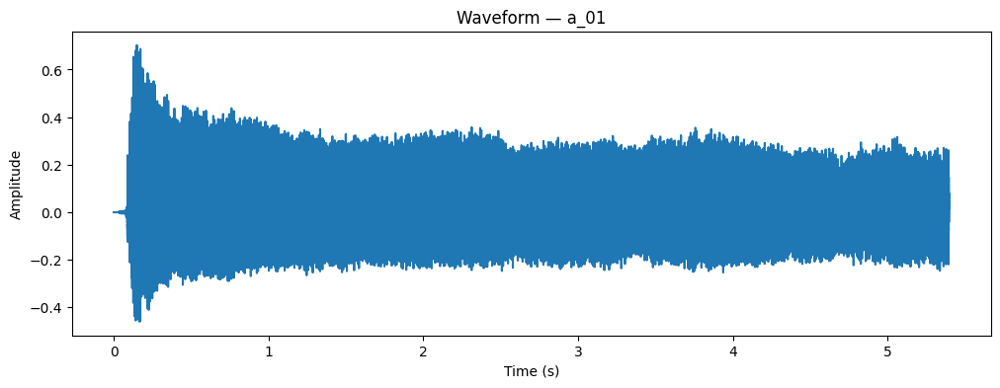

In [ ]:
audio_path = (
  wav_dir / "a_01.wav"
)

wave, sr = inspect_audio(
  audio_path
)

## 4. Dataset Quality Check

All recordings are checked for basic technical consistency.

The measurements include:

- duration,
- peak amplitude,
- RMS,
- clipping count.

This is a technical quality-control step rather than an acoustic model of vowel identity.

In [ ]:
qc_rows = []


for audio_path in wav_files:
  wave_temp, sr_temp = sf.read(
    audio_path
  )


  duration = (
    len(wave_temp)
    / sr_temp
  )


  peak_amp = np.max(
    np.abs(wave_temp)
  )


  rms = np.sqrt(
    np.mean(
      wave_temp ** 2
    )
  )


  clip_count = np.sum(
    np.abs(wave_temp) >= 0.999
  )


  qc_rows.append({
    "file": audio_path.name,
    "duration_s": duration,
    "peak_amp": peak_amp,
    "rms": rms,
    "clip_count": clip_count,
  })


qc_df = pd.DataFrame(
  qc_rows
)


qc_df = qc_df.round({
  "duration_s": 2,
  "peak_amp": 4,
  "rms": 4,
})


display(
  qc_df
)

,file,duration_s,peak_amp,rms,clip_count
0,a_01.wav,5.40,0.7024,0.0912,0
1,a_02.wav,6.25,0.4359,0.0776,0
2,e_01.wav,6.23,0.3087,0.0673,0
3,e_02.wav,5.44,0.2625,0.0560,0
4,i_01.wav,5.40,0.1791,0.0659,0
5,i_02.wav,6.08,0.1623,0.0532,0
6,o_01.wav,6.17,0.2318,0.0579,0
7,o_02.wav,5.50,0.1819,0.0476,0
8,u_01.wav,6.57,0.2397,0.0675,0
9,u_02.wav,6.21,0.1647,0.0480,0


## 5. Fundamental-Frequency Check

The recordings should have reasonably similar fundamental frequencies because vowel spectra are sampled by harmonics whose spacing depends on f0.

A simple autocorrelation-based estimator is used to check pitch consistency.

This f0 estimator is used for quality control rather than as the central DeVowel algorithm.

In [ ]:
def estimate_frame_f0(
  frame,
  sr,
  fmin=70,
  fmax=500,
):
  frame = (
    frame
    - np.mean(frame)
  )


  frame = (
    frame
    * np.hanning(
      len(frame)
    )
  )


  autocorr = correlate(
    frame,
    frame,
    mode="full",
    method="fft",
  )


  autocorr = autocorr[
    len(autocorr) // 2:
  ]


  min_lag = int(
    sr / fmax
  )

  max_lag = int(
    sr / fmin
  )


  search = autocorr[
    min_lag:
    max_lag + 1
  ]


  peak_lag = (
    np.argmax(search)
    + min_lag
  )


  return (
    sr / peak_lag
  )

In [ ]:
def estimate_audio_f0(
  wave,
  sr,
  center_duration=2.0,
):
  center_sample = (
    len(wave) // 2
  )


  half_length = int(
    center_duration
    * sr
    / 2
  )


  start = max(
    0,
    center_sample - half_length,
  )

  end = min(
    len(wave),
    center_sample + half_length,
  )


  stable_wave = wave[
    start:end
  ]


  frame_length = int(
    0.05 * sr
  )

  hop_length = int(
    0.02 * sr
  )


  f0_values = []


  for start_idx in range(
    0,
    len(stable_wave)
    - frame_length,
    hop_length,
  ):
    frame = stable_wave[
      start_idx:
      start_idx + frame_length
    ]


    frame_rms = np.sqrt(
      np.mean(
        frame ** 2
      )
    )


    if frame_rms < 0.01:
      continue


    f0 = estimate_frame_f0(
      frame,
      sr,
    )


    f0_values.append(
      f0
    )


  return np.array(
    f0_values
  )

## 6. Spectrum Analysis

For each recording, the stable central 2 seconds are analyzed.

Pipeline:

1. select the central segment,
2. remove DC offset,
3. apply a Hann window,
4. compute the real FFT,
5. calculate magnitude,
6. create the frequency axis,
7. convert magnitude to dB,
8. normalize the maximum to 0 dB.

The narrow peaks of the raw spectrum mainly correspond to source harmonics.

The broader shape across harmonics is related to vocal-tract filtering.

In [ ]:
def compute_spectrum(
  wave,
  sr,
  center_duration=2.0,
):
  center_sample = (
    len(wave) // 2
  )


  half_length = int(
    center_duration
    * sr
    / 2
  )


  start = max(
    0,
    center_sample - half_length,
  )

  end = min(
    len(wave),
    center_sample + half_length,
  )


  stable_wave = wave[
    start:end
  ]


  stable_wave = (
    stable_wave
    - np.mean(stable_wave)
  )


  window = np.hanning(
    len(stable_wave)
  )


  windowed_wave = (
    stable_wave
    * window
  )


  spectrum = np.fft.rfft(
    windowed_wave
  )


  mag = np.abs(
    spectrum
  )


  freqs = np.fft.rfftfreq(
    len(windowed_wave),
    d=1 / sr,
  )


  mag_db = (
    20
    * np.log10(
      mag + 1e-12
    )
  )


  mag_db = (
    mag_db
    - np.max(mag_db)
  )


  return (
    freqs,
    mag_db,
  )

In [ ]:
audio_path = (
  wav_dir / "a_01.wav"
)

wave, sr = sf.read(
  audio_path
)


freqs, mag_db = compute_spectrum(
  wave,
  sr,
)


print(
  "Sample rate:",
  sr,
)

print(
  "Frequency bins:",
  len(freqs),
)

print(
  "Spectrum bins:",
  len(mag_db),
)

print(
  "First frequencies:",
  freqs[:5],
)

print(
  "Last frequency:",
  freqs[-1],
)

print(
  "Bin spacing:",
  freqs[1] - freqs[0],
  "Hz",
)

print(
  "Maximum magnitude:",
  np.max(mag_db),
)

Sample rate: 44100
Frequency bins: 44101
Spectrum bins: 44101
First frequencies: [0.  0.5 1.  1.5 2. ]
Last frequency: 22050.0
Bin spacing: 0.5 Hz
Maximum magnitude: 0.0


### 6.1 Raw Spectrum

The raw FFT spectrum contains many narrow harmonic peaks.

These individual peaks should not be interpreted directly as formants.

Formants are broader vocal-tract resonances that shape the relative amplitudes of multiple harmonics.

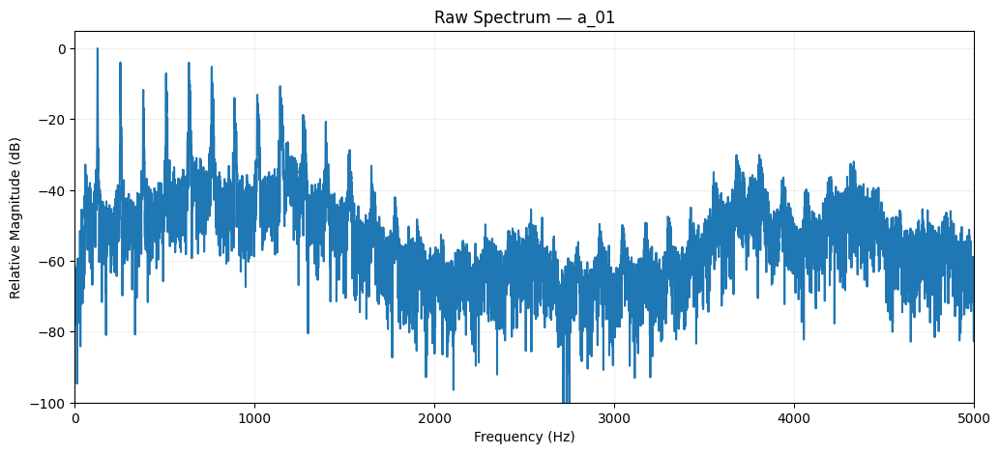

In [ ]:
mask = (
  freqs <= 5000
)


plt.figure(
  figsize=(12, 5)
)


plt.plot(
  freqs[mask],
  mag_db[mask],
)


plt.xlabel(
  "Frequency (Hz)"
)

plt.ylabel(
  "Relative Magnitude (dB)"
)

plt.title(
  "Raw Spectrum — a_01"
)

plt.xlim(
  0,
  5000,
)

plt.ylim(
  -100,
  5,
)

plt.grid(
  alpha=0.2
)


plt.show()

## 7. Gaussian-Smoothed Spectral Envelope

The raw spectrum is dominated by narrow harmonic peaks.

Gaussian smoothing is used as a first exploratory approximation of the broader spectral envelope.

The smoothing parameter is specified in Hz but `gaussian_filter1d()` operates in array-bin units.

Therefore:

smoothing width in Hz
→ divide by FFT-bin spacing
→ smoothing sigma in bins

After smoothing, the envelope is normalized again so that its maximum is 0 dB.

This curve is an exploratory spectral-envelope estimate, not a formal formant measurement.

In [ ]:
def compute_spectral_envelope(
  freqs,
  mag_db,
  smoothing_sigma_hz=50,
):
  bin_spacing_hz = (
    freqs[1]
    - freqs[0]
  )


  sigma_bins = (
    smoothing_sigma_hz
    / bin_spacing_hz
  )


  envelope_db = gaussian_filter1d(
    mag_db,
    sigma=sigma_bins,
  )


  envelope_db = (
    envelope_db
    - np.max(envelope_db)
  )


  return envelope_db

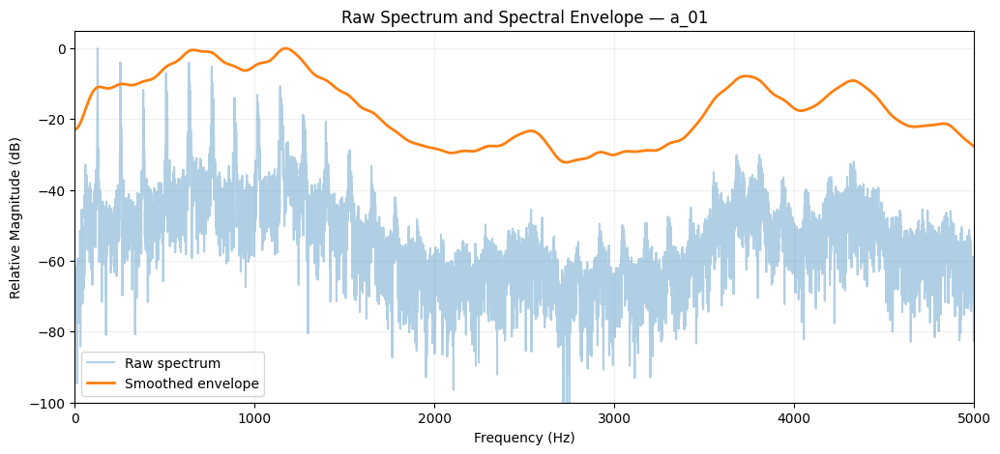

In [ ]:
envelope_db = compute_spectral_envelope(
  freqs,
  mag_db,
  smoothing_sigma_hz=50,
)


mask = (
  freqs <= 5000
)


plt.figure(
  figsize=(12, 5)
)


plt.plot(
  freqs[mask],
  mag_db[mask],
  alpha=0.35,
  label="Raw spectrum",
)


plt.plot(
  freqs[mask],
  envelope_db[mask],
  linewidth=2,
  label="Smoothed envelope",
)


plt.xlabel(
  "Frequency (Hz)"
)

plt.ylabel(
  "Relative Magnitude (dB)"
)

plt.title(
  "Raw Spectrum and Spectral Envelope — a_01"
)

plt.xlim(
  0,
  5000,
)

plt.ylim(
  -100,
  5,
)

plt.legend()

plt.grid(
  alpha=0.2
)


plt.show()

## 8. Vowel Spectral-Envelope Comparison

One take from each vowel is compared.

Each envelope is normalized independently.

The purpose is therefore to compare broad spectral shape rather than absolute recording loudness.

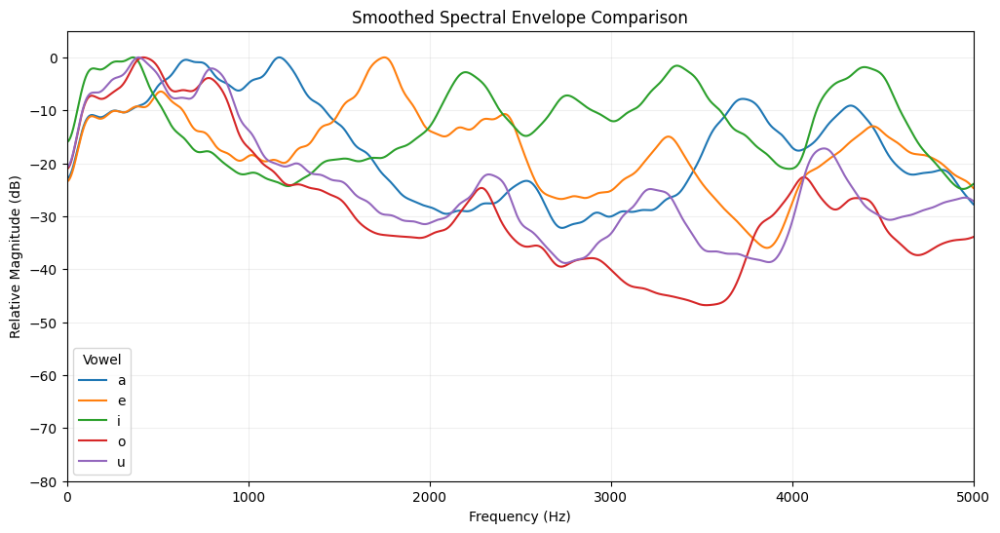

In [ ]:
vowels = [
  "a",
  "e",
  "i",
  "o",
  "u",
]


comparison_files = [
  "a_01.wav",
  "e_01.wav",
  "i_01.wav",
  "o_01.wav",
  "u_01.wav",
]


plt.figure(
  figsize=(12, 6)
)


for filename in comparison_files:
  audio_path = (
    wav_dir / filename
  )


  wave_temp, sr_temp = sf.read(
    audio_path
  )


  freqs_temp, mag_db_temp = compute_spectrum(
    wave_temp,
    sr_temp,
  )


  envelope_temp = compute_spectral_envelope(
    freqs_temp,
    mag_db_temp,
    smoothing_sigma_hz=50,
  )


  mask = (
    freqs_temp <= 5000
  )


  plt.plot(
    freqs_temp[mask],
    envelope_temp[mask],
    label=filename[0],
  )


plt.xlabel(
  "Frequency (Hz)"
)

plt.ylabel(
  "Relative Magnitude (dB)"
)

plt.title(
  "Smoothed Spectral Envelope Comparison"
)

plt.xlim(
  0,
  5000,
)

plt.ylim(
  -80,
  5,
)

plt.legend(
  title="Vowel"
)

plt.grid(
  alpha=0.2
)


plt.show()

## 9. Within-Vowel Repeatability

Each vowel was recorded twice.

The two takes of each vowel are compared to determine whether the broad spectral-envelope structure is repeatable.

Stable similarity within vowels is necessary before interpreting differences between vowels as vowel-dependent structure.

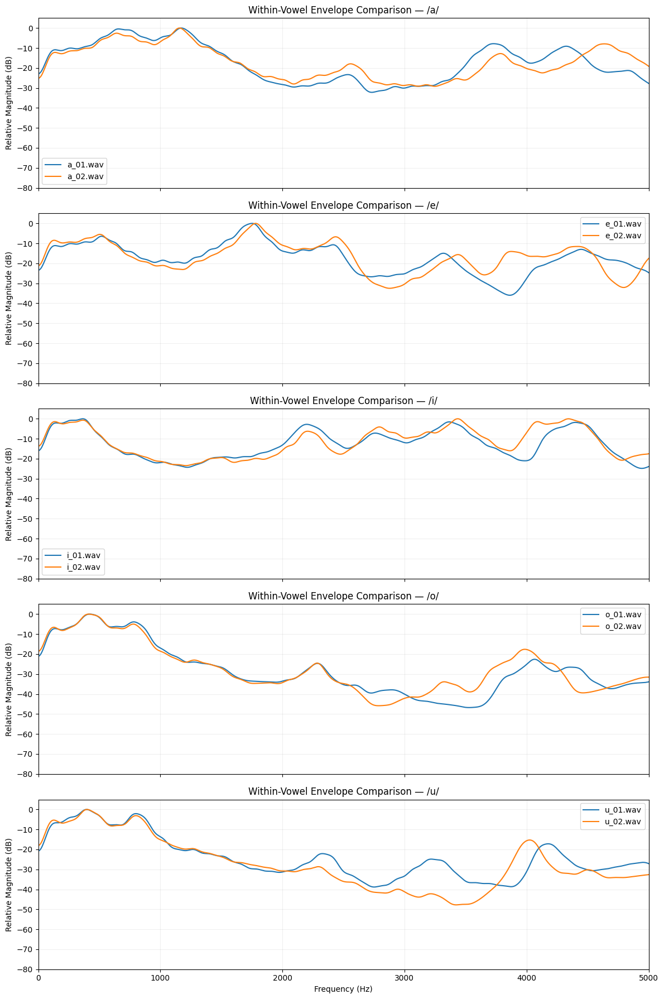

In [ ]:
fig, axes = plt.subplots(
  len(vowels),
  1,
  figsize=(12, 18),
  sharex=True,
  sharey=True,
)


for ax, vowel in zip(
  axes,
  vowels,
):
  filenames = [
    f"{vowel}_01.wav",
    f"{vowel}_02.wav",
  ]


  for filename in filenames:
    audio_path = (
      wav_dir / filename
    )


    wave_temp, sr_temp = sf.read(
      audio_path
    )


    freqs_temp, mag_db_temp = compute_spectrum(
      wave_temp,
      sr_temp,
    )


    envelope_temp = compute_spectral_envelope(
      freqs_temp,
      mag_db_temp,
      smoothing_sigma_hz=50,
    )


    mask = (
      freqs_temp <= 5000
    )


    ax.plot(
      freqs_temp[mask],
      envelope_temp[mask],
      label=filename,
    )


  ax.set_title(
    f"Within-Vowel Envelope Comparison — /{vowel}/"
  )

  ax.set_ylabel(
    "Relative Magnitude (dB)"
  )

  ax.set_ylim(
    -80,
    5,
  )

  ax.grid(
    alpha=0.2
  )

  ax.legend()


axes[-1].set_xlabel(
  "Frequency (Hz)"
)

axes[-1].set_xlim(
  0,
  5000,
)


plt.tight_layout()

plt.show()

In [ ]:
envelopes = {}

reference_freqs = None


for audio_path in wav_files:
  wave_temp, sr_temp = sf.read(
    audio_path
  )


  freqs_temp, mag_db_temp = compute_spectrum(
    wave_temp,
    sr_temp,
  )


  envelope_temp = compute_spectral_envelope(
    freqs_temp,
    mag_db_temp,
    smoothing_sigma_hz=50,
  )


  if reference_freqs is None:
    reference_freqs = (
      freqs_temp
    )


  if not np.allclose(
    freqs_temp,
    reference_freqs,
  ):
    raise ValueError(
      "Frequency axes are not identical."
    )


  envelopes[
    audio_path.name
  ] = envelope_temp


print(
  "Stored envelopes:",
  len(envelopes),
)

Stored envelopes: 10


### 9.1 Numerical Envelope Similarity

Two exploratory similarity measurements are used:

- Pearson correlation: similarity of overall curve shape.
- MAE (Mean Absolute Error): average absolute difference in dB.

Higher correlation and lower MAE indicate greater similarity.

These are exploratory descriptors rather than definitive perceptual-distance measures.

In [ ]:
analysis_mask = (
  (reference_freqs >= 100)
  & (reference_freqs <= 5000)
)


repeatability_rows = []


for vowel in vowels:
  file_01 = (
    f"{vowel}_01.wav"
  )

  file_02 = (
    f"{vowel}_02.wav"
  )


  envelope_01 = envelopes[
    file_01
  ][analysis_mask]


  envelope_02 = envelopes[
    file_02
  ][analysis_mask]


  corr = np.corrcoef(
    envelope_01,
    envelope_02,
  )[0, 1]


  mae_db = np.mean(
    np.abs(
      envelope_01
      - envelope_02
    )
  )


  repeatability_rows.append({
    "vowel": vowel,
    "correlation": corr,
    "mae_db": mae_db,
  })


repeatability_df = pd.DataFrame(
  repeatability_rows
)


repeatability_df = repeatability_df.round({
  "correlation": 3,
  "mae_db": 2,
})


display(
  repeatability_df
)

,vowel,correlation,mae_db
0,a,0.850,3.77
1,e,0.709,4.21
2,i,0.874,2.45
3,o,0.923,3.19
4,u,0.870,4.84


### 9.2 Within-Vowel vs Between-Vowel Differences

All recording pairs are classified as:

- `within`: two takes of the same vowel,
- `between`: recordings of different vowels.

If within-vowel pairs are systematically more similar than between-vowel pairs, the envelope representation contains stable vowel-dependent information.

In [ ]:
pair_rows = []


filenames = sorted(
  envelopes.keys()
)


for i in range(
  len(filenames)
):
  for j in range(
    i + 1,
    len(filenames)
  ):
    file_a = filenames[i]
    file_b = filenames[j]


    vowel_a = file_a[0]
    vowel_b = file_b[0]


    envelope_a = envelopes[
      file_a
    ][analysis_mask]


    envelope_b = envelopes[
      file_b
    ][analysis_mask]


    corr = np.corrcoef(
      envelope_a,
      envelope_b,
    )[0, 1]


    mae_db = np.mean(
      np.abs(
        envelope_a
        - envelope_b
      )
    )


    pair_type = (
      "within"
      if vowel_a == vowel_b
      else "between"
    )


    pair_rows.append({
      "file_a": file_a,
      "file_b": file_b,
      "type": pair_type,
      "correlation": corr,
      "mae_db": mae_db,
    })


pair_df = pd.DataFrame(
  pair_rows
)


display(
  pair_df.head(10)
)

,file_a,file_b,type,correlation,mae_db
0,a_01.wav,a_02.wav,within,0.850146,3.767493
1,a_01.wav,e_01.wav,between,0.084364,9.380590
2,a_01.wav,e_02.wav,between,0.198429,8.567429
3,a_01.wav,i_01.wav,between,-0.282875,12.213067
4,a_01.wav,i_02.wav,between,-0.199843,12.319853
5,a_01.wav,o_01.wav,between,0.684143,12.141327
6,a_01.wav,o_02.wav,between,0.739219,11.434546
7,a_01.wav,u_01.wav,between,0.617099,8.807440
8,a_01.wav,u_02.wav,between,0.693331,11.220980
9,a_02.wav,e_01.wav,between,0.184433,8.110316


In [ ]:
summary_df = (
  pair_df
  .groupby("type")[
    [
      "correlation",
      "mae_db",
    ]
  ]
  .mean()
  .round(3)
)


display(
  summary_df
)

,correlation,mae_db
type,,
between,0.288,11.625
within,0.845,3.693


## 10. Spectral-Envelope Peak Detection

Local maxima of the Gaussian-smoothed spectral envelope are detected as exploratory resonance candidates.

These peaks are not automatically identified as F1, F2, or F3.

`find_peaks()` detects mathematical local maxima according to the supplied conditions; it does not know what a formant is.

A prominence threshold is used to reject very small local fluctuations.

In [ ]:
audio_path = (
  wav_dir / "a_01.wav"
)


wave, sr = sf.read(
  audio_path
)


freqs, mag_db = compute_spectrum(
  wave,
  sr,
)


envelope_db = compute_spectral_envelope(
  freqs,
  mag_db,
  smoothing_sigma_hz=50,
)


peak_mask = (
  (freqs >= 100)
  & (freqs <= 5000)
)


analysis_freqs = freqs[
  peak_mask
]

analysis_envelope = envelope_db[
  peak_mask
]


peak_indices, properties = find_peaks(
  analysis_envelope,
  prominence=3,
)


peak_freqs = analysis_freqs[
  peak_indices
]

peak_db = analysis_envelope[
  peak_indices
]


print(
  "Detected peak frequencies:"
)

print(
  np.round(
    peak_freqs,
    1,
  )
)

Detected peak frequencies:
[ 657.5 1172.  2535.5 3729.  4324. ]


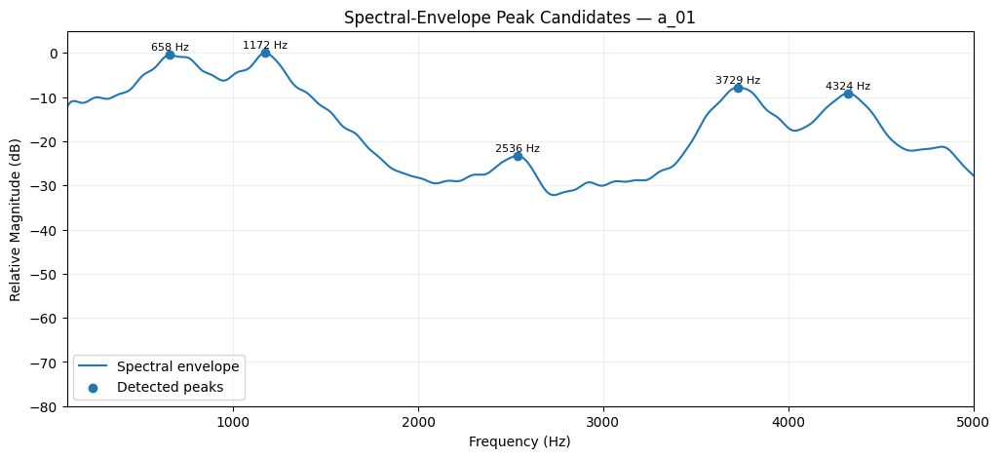

In [ ]:
plt.figure(
  figsize=(12, 5)
)


plt.plot(
  analysis_freqs,
  analysis_envelope,
  label="Spectral envelope",
)


plt.scatter(
  peak_freqs,
  peak_db,
  zorder=3,
  label="Detected peaks",
)


for freq, db in zip(
  peak_freqs,
  peak_db,
):
  plt.text(
    freq,
    db + 1,
    f"{freq:.0f} Hz",
    ha="center",
    fontsize=8,
  )


plt.xlabel(
  "Frequency (Hz)"
)

plt.ylabel(
  "Relative Magnitude (dB)"
)

plt.title(
  "Spectral-Envelope Peak Candidates — a_01"
)

plt.xlim(
  100,
  5000,
)

plt.ylim(
  -80,
  5,
)

plt.legend()

plt.grid(
  alpha=0.2
)


plt.show()

In [ ]:
peak_rows = []


for vowel in vowels:
  filename = (
    f"{vowel}_01.wav"
  )


  audio_path = (
    wav_dir / filename
  )


  wave_temp, sr_temp = sf.read(
    audio_path
  )


  freqs_temp, mag_db_temp = compute_spectrum(
    wave_temp,
    sr_temp,
  )


  envelope_temp = compute_spectral_envelope(
    freqs_temp,
    mag_db_temp,
    smoothing_sigma_hz=50,
  )


  mask = (
    (freqs_temp >= 100)
    & (freqs_temp <= 5000)
  )


  freqs_roi = freqs_temp[
    mask
  ]

  envelope_roi = envelope_temp[
    mask
  ]


  peak_indices, properties = find_peaks(
    envelope_roi,
    prominence=3,
  )


  peak_freqs_temp = freqs_roi[
    peak_indices
  ]


  peak_rows.append({
    "vowel": vowel,
    "peak_freqs_hz": np.round(
      peak_freqs_temp,
      1,
    ),
  })


peak_df = pd.DataFrame(
  peak_rows
)


display(
  peak_df
)

,vowel,peak_freqs_hz
0,a,"[657.5, 1172.0, 2535.5, 3729.0, 4324.0]"
1,e,"[518.5, 1752.0, 2415.0, 3318.5, 4446.5]"
2,i,"[365.0, 2199.5, 2760.0, 3366.0, 4399.5]"
3,o,"[422.0, 2287.5, 4066.0]"
4,u,"[395.5, 800.0, 2327.5, 3219.0, 4177.0]"


## 11. LPC Spectral Envelope

Gaussian smoothing is useful for visualization, but it does not explicitly model vocal-tract resonances.

Linear Predictive Coding (LPC) models a speech sample as approximately predictable from previous samples.

The resulting prediction model can be interpreted as an all-pole filter.

The resonances of this filter provide an approximation of vocal-tract resonance structure.

LPC is still a model rather than a direct physical measurement of the vocal tract.

In [ ]:
def compute_lpc_envelope(
  wave,
  sr,
  center_duration=2.0,
  target_sr=10000,
  order=16,
  n_freqs=4096,
):
  center_sample = (
    len(wave) // 2
  )


  half_length = int(
    center_duration
    * sr
    / 2
  )


  start = max(
    0,
    center_sample - half_length,
  )

  end = min(
    len(wave),
    center_sample + half_length,
  )


  stable_wave = wave[
    start:end
  ]


  stable_wave = (
    stable_wave
    - np.mean(stable_wave)
  )


  if sr != target_sr:
    gcd = np.gcd(
      sr,
      target_sr,
    )


    up = (
      target_sr // gcd
    )

    down = (
      sr // gcd
    )


    stable_wave = resample_poly(
      stable_wave,
      up,
      down,
    )


    analysis_sr = (
      target_sr
    )

  else:
    analysis_sr = (
      sr
    )


  window = np.hanning(
    len(stable_wave)
  )


  windowed_wave = (
    stable_wave
    * window
  )


  lpc_coeffs = librosa.lpc(
    windowed_wave,
    order=order,
  )


  freqs_lpc, response = freqz(
    b=[1.0],
    a=lpc_coeffs,
    worN=n_freqs,
    fs=analysis_sr,
  )


  envelope_lpc_db = (
    20
    * np.log10(
      np.abs(response)
      + 1e-12
    )
  )


  envelope_lpc_db = (
    envelope_lpc_db
    - np.max(
      envelope_lpc_db
    )
  )


  return (
    freqs_lpc,
    envelope_lpc_db,
    lpc_coeffs,
  )

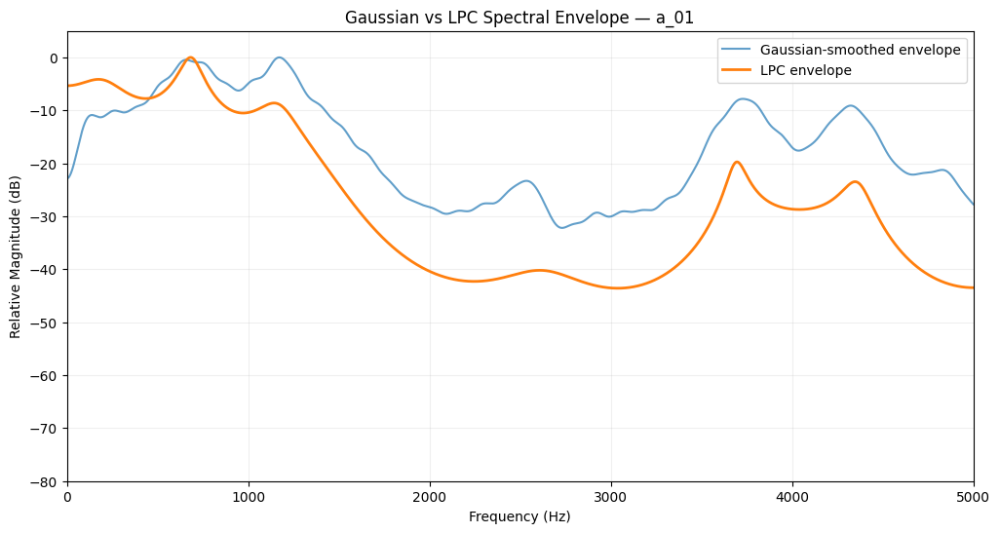

In [ ]:
audio_path = (
  wav_dir / "a_01.wav"
)

wave, sr = sf.read(
  audio_path
)


freqs_raw, mag_db = compute_spectrum(
  wave,
  sr,
)


gaussian_envelope = compute_spectral_envelope(
  freqs_raw,
  mag_db,
  smoothing_sigma_hz=50,
)


(
  freqs_lpc,
  lpc_envelope,
  lpc_coeffs,
) = compute_lpc_envelope(
  wave,
  sr,
  order=16,
)


raw_mask = (
  freqs_raw <= 5000
)


plt.figure(
  figsize=(12, 6)
)


plt.plot(
  freqs_raw[raw_mask],
  gaussian_envelope[raw_mask],
  label="Gaussian-smoothed envelope",
  alpha=0.7,
)


plt.plot(
  freqs_lpc,
  lpc_envelope,
  label="LPC envelope",
  linewidth=2,
)


plt.xlabel(
  "Frequency (Hz)"
)

plt.ylabel(
  "Relative Magnitude (dB)"
)

plt.title(
  "Gaussian vs LPC Spectral Envelope — a_01"
)

plt.xlim(
  0,
  5000,
)

plt.ylim(
  -80,
  5,
)

plt.legend()

plt.grid(
  alpha=0.2
)


plt.show()

### 11.1 LPC Order Stability

The LPC spectral envelope depends on model order.

Too low an order may miss resonances.

Too high an order may model small spectral details as additional resonances.

Several orders are therefore compared.

Resonances that remain at approximately the same frequency across reasonable orders are more robust candidates.

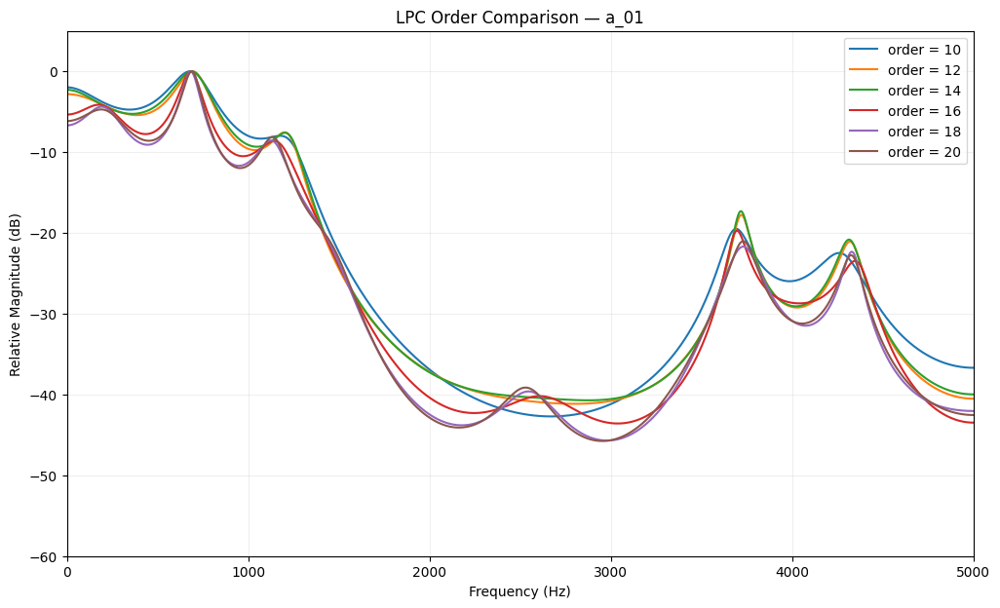

In [ ]:
lpc_orders = [
  10,
  12,
  14,
  16,
  18,
  20,
]


plt.figure(
  figsize=(12, 7)
)


for order in lpc_orders:
  (
    freqs_lpc,
    lpc_envelope,
    lpc_coeffs,
  ) = compute_lpc_envelope(
    wave,
    sr,
    order=order,
  )


  plt.plot(
    freqs_lpc,
    lpc_envelope,
    label=f"order = {order}",
  )


plt.xlabel(
  "Frequency (Hz)"
)

plt.ylabel(
  "Relative Magnitude (dB)"
)

plt.title(
  "LPC Order Comparison — a_01"
)

plt.xlim(
  0,
  5000,
)

plt.ylim(
  -60,
  5,
)

plt.legend()

plt.grid(
  alpha=0.2
)


plt.show()

## 12. LPC Poles and Formant Candidates

The LPC spectral envelope is the frequency response of an all-pole model.

Instead of detecting peaks only from the plotted curve, the roots of the LPC prediction polynomial can be analyzed directly.

Complex-conjugate pole pairs correspond to resonant modes.

For each pole:

- pole angle determines resonance frequency,
- pole radius determines damping,
- damping can be expressed as bandwidth.

This produces resonance candidates represented by both frequency and bandwidth.

These candidates are not automatically guaranteed to be physical formants.

In [ ]:
def compute_lpc_formant_candidates(
  frame,
  sr,
  order=12,
  pre_emphasis=0.97,
  min_freq=90,
  max_freq=5000,
  max_bandwidth=500,
):
  frame = (
    frame
    - np.mean(frame)
  )


  emphasized = lfilter(
    [1.0, -pre_emphasis],
    [1.0],
    frame,
  )


  window = np.hamming(
    len(emphasized)
  )


  windowed = (
    emphasized
    * window
  )


  lpc_coeffs = librosa.lpc(
    windowed,
    order=order,
  )


  roots = np.roots(
    lpc_coeffs
  )


  roots = roots[
    np.imag(roots) >= 0
  ]


  radii = np.abs(
    roots
  )


  angles = np.angle(
    roots
  )


  formant_freqs = (
    angles
    * sr
    / (2 * np.pi)
  )


  bandwidths = (
    -sr
    / np.pi
    * np.log(
      radii
    )
  )


  valid = (
    (formant_freqs >= min_freq)
    & (formant_freqs <= max_freq)
    & (radii < 1.0)
    & (bandwidths > 0)
    & (bandwidths <= max_bandwidth)
  )


  formant_freqs = (
    formant_freqs[
      valid
    ]
  )


  bandwidths = (
    bandwidths[
      valid
    ]
  )


  order_idx = np.argsort(
    formant_freqs
  )


  formant_freqs = (
    formant_freqs[
      order_idx
    ]
  )


  bandwidths = (
    bandwidths[
      order_idx
    ]
  )


  return (
    formant_freqs,
    bandwidths,
  )

In [ ]:
audio_path = (
  wav_dir / "a_01.wav"
)


wave, sr = sf.read(
  audio_path
)


target_sr = 10000


center_sample = (
  len(wave) // 2
)


frame_duration = (
  0.03
)


half_frame = int(
  frame_duration
  * sr
  / 2
)


frame = wave[
  center_sample - half_frame:
  center_sample + half_frame
]


gcd = np.gcd(
  sr,
  target_sr,
)


up = (
  target_sr // gcd
)

down = (
  sr // gcd
)


frame_resampled = resample_poly(
  frame,
  up,
  down,
)


(
  formant_freqs,
  formant_bandwidths,
) = compute_lpc_formant_candidates(
  frame_resampled,
  target_sr,
  order=12,
)


formant_candidate_df = pd.DataFrame({
  "frequency_hz": formant_freqs,
  "bandwidth_hz": formant_bandwidths,
})


formant_candidate_df = (
  formant_candidate_df
  .round(1)
)


display(
  formant_candidate_df
)

,frequency_hz,bandwidth_hz
0,692.3,135.3
1,1209.3,122.5
2,3698.4,135.7
3,4369.5,139.9


## 13. Temporal LPC Resonance Stability

A single 30 ms frame provides only a snapshot of the vocal-tract model.

A sustained vowel should produce resonance candidates that remain in similar frequency regions across many neighboring frames.

The central 2 seconds of each recording are therefore divided into short overlapping frames.

For each frame:

1. LPC coefficients are estimated,
2. LPC polynomial roots are calculated,
3. pole frequencies and bandwidths are extracted,
4. implausibly broad resonances are removed.

The resulting frequency-bandwidth candidates are observed across time.

Stable horizontal clusters of candidates are stronger formant candidates than isolated or rapidly moving poles.

In [ ]:
def track_lpc_candidates(
  wave,
  sr,
  center_duration=2.0,
  target_sr=10000,
  frame_duration=0.03,
  hop_duration=0.01,
  order=12,
  pre_emphasis=0.97,
  min_freq=90,
  max_freq=5000,
  max_bandwidth=500,
):
  center_sample = (
    len(wave) // 2
  )

  half_length = int(
    center_duration
    * sr
    / 2
  )

  start = max(
    0,
    center_sample - half_length,
  )

  end = min(
    len(wave),
    center_sample + half_length,
  )

  stable_wave = wave[
    start:end
  ]


  if sr != target_sr:
    gcd = np.gcd(
      sr,
      target_sr,
    )

    up = (
      target_sr // gcd
    )

    down = (
      sr // gcd
    )

    stable_wave = resample_poly(
      stable_wave,
      up,
      down,
    )

    analysis_sr = target_sr

  else:
    analysis_sr = sr


  frame_length = int(
    frame_duration
    * analysis_sr
  )

  hop_length = int(
    hop_duration
    * analysis_sr
  )


  candidate_rows = []


  for start_idx in range(
    0,
    len(stable_wave)
    - frame_length
    + 1,
    hop_length,
  ):
    frame = stable_wave[
      start_idx:
      start_idx + frame_length
    ]


    frame_rms = np.sqrt(
      np.mean(
        frame ** 2
      )
    )


    if frame_rms < 0.01:
      continue


    (
      formant_freqs,
      bandwidths,
    ) = compute_lpc_formant_candidates(
      frame,
      analysis_sr,
      order=order,
      pre_emphasis=pre_emphasis,
      min_freq=min_freq,
      max_freq=max_freq,
      max_bandwidth=max_bandwidth,
    )


    frame_center_s = (
      start_idx
      + frame_length / 2
    ) / analysis_sr


    for freq, bandwidth in zip(
      formant_freqs,
      bandwidths,
    ):
      candidate_rows.append({
        "time_s": frame_center_s,
        "frequency_hz": freq,
        "bandwidth_hz": bandwidth,
      })


  return pd.DataFrame(
    candidate_rows
  )

In [ ]:
audio_path = (
  wav_dir / "a_01.wav"
)

wave, sr = sf.read(
  audio_path
)


a_candidates_df = track_lpc_candidates(
  wave,
  sr,
  center_duration=2.0,
  target_sr=10000,
  frame_duration=0.03,
  hop_duration=0.01,
  order=12,
  max_bandwidth=500,
)


print(
  "Detected candidates:",
  len(a_candidates_df),
)

print(
  "Analyzed frames approximately:",
  a_candidates_df["time_s"].nunique(),
)


display(
  a_candidates_df.head(10)
)

Detected candidates: 793
Analyzed frames approximately: 198


,time_s,frequency_hz,bandwidth_hz
0,0.015,669.425991,170.881553
1,0.015,1210.572245,233.513520
2,0.015,3772.310762,151.335041
3,0.015,4348.899525,210.436848
4,0.025,700.147517,145.652135
5,0.025,1194.469490,137.427795
6,0.025,3790.755527,197.882534
7,0.025,4352.398194,201.310360
8,0.035,708.472605,137.180645
9,0.035,1221.343799,121.256877


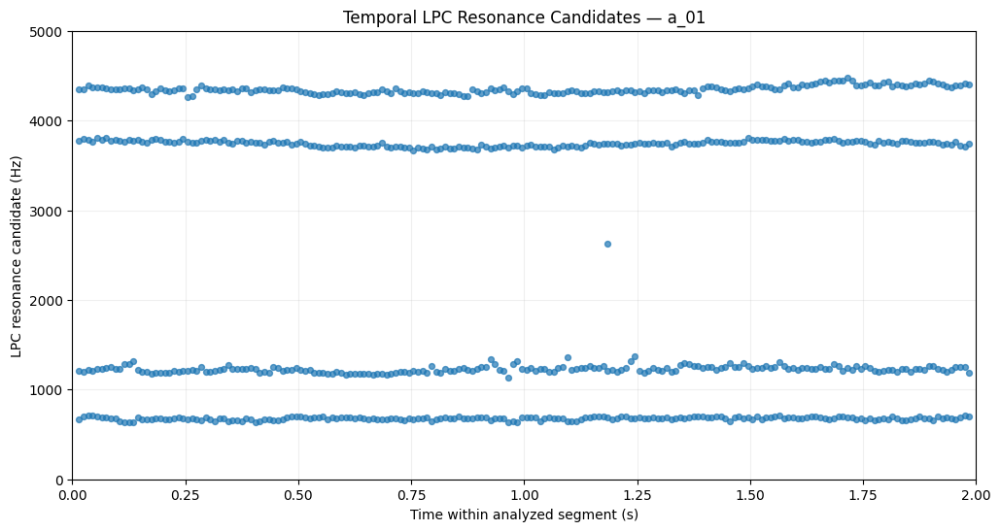

In [ ]:
plt.figure(
  figsize=(12, 6)
)


plt.scatter(
  a_candidates_df["time_s"],
  a_candidates_df["frequency_hz"],
  s=18,
  alpha=0.7,
)


plt.xlabel(
  "Time within analyzed segment (s)"
)

plt.ylabel(
  "LPC resonance candidate (Hz)"
)

plt.title(
  "Temporal LPC Resonance Candidates — a_01"
)

plt.xlim(
  0,
  2.0,
)

plt.ylim(
  0,
  5000,
)

plt.grid(
  alpha=0.2
)


plt.show()

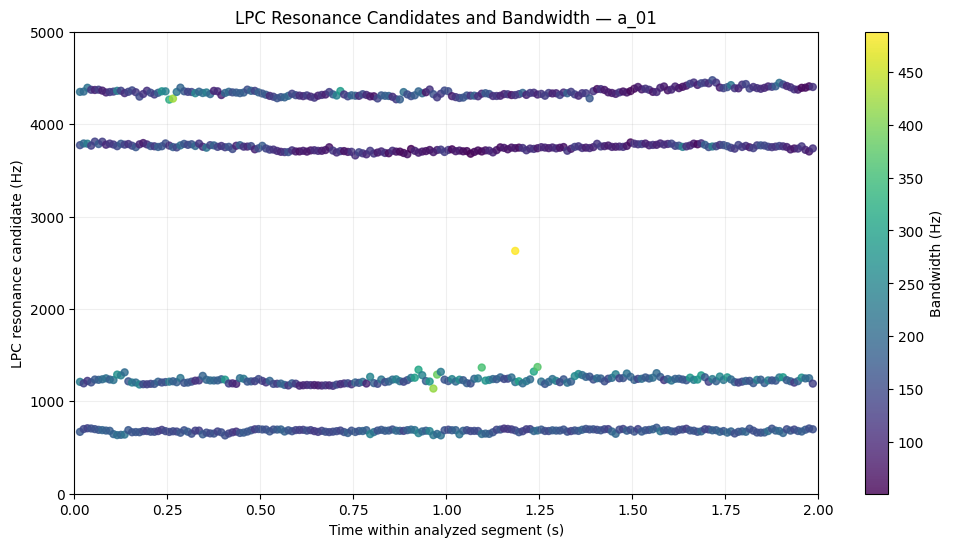

In [ ]:
plt.figure(
  figsize=(12, 6)
)


scatter = plt.scatter(
  a_candidates_df["time_s"],
  a_candidates_df["frequency_hz"],
  c=a_candidates_df["bandwidth_hz"],
  s=25,
  alpha=0.8,
)


plt.colorbar(
  scatter,
  label="Bandwidth (Hz)",
)


plt.xlabel(
  "Time within analyzed segment (s)"
)

plt.ylabel(
  "LPC resonance candidate (Hz)"
)

plt.title(
  "LPC Resonance Candidates and Bandwidth — a_01"
)

plt.xlim(
  0,
  2.0,
)

plt.ylim(
  0,
  5000,
)

plt.grid(
  alpha=0.2
)


plt.show()

### 13.1 Resonance-Candidate Frequency Distribution

Stable vocal-tract resonances should produce LPC pole candidates repeatedly in similar frequency regions across frames.

A histogram of all candidate frequencies provides a simple view of these recurring regions.

Dense frequency regions are possible stable resonance bands.

The histogram is used for exploration and does not itself assign formal F1, F2, or F3 labels.

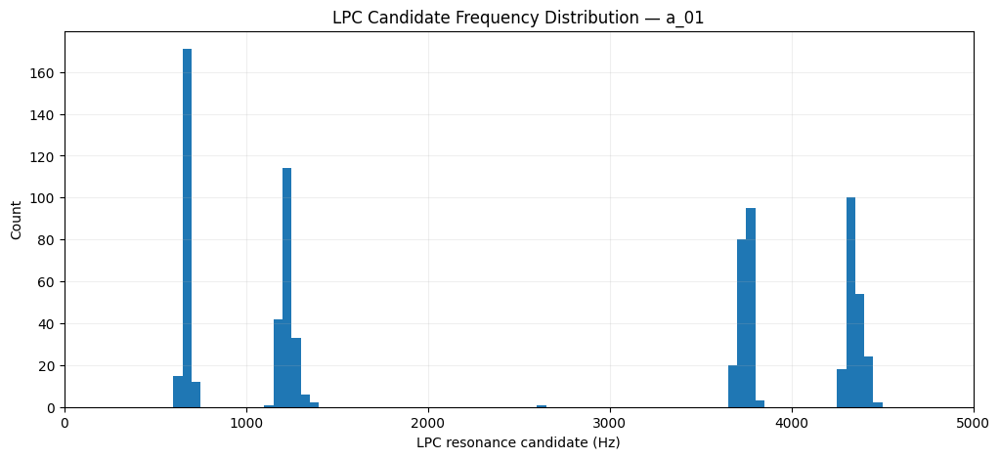

In [ ]:
plt.figure(
  figsize=(12, 5)
)


plt.hist(
  a_candidates_df["frequency_hz"],
  bins=np.arange(
    0,
    5050,
    50,
  ),
)


plt.xlabel(
  "LPC resonance candidate (Hz)"
)

plt.ylabel(
  "Count"
)

plt.title(
  "LPC Candidate Frequency Distribution — a_01"
)

plt.xlim(
  0,
  5000,
)

plt.grid(
  alpha=0.2
)


plt.show()

## 14. Stable Resonance Bands

The temporal LPC analysis shows that resonance candidates repeatedly cluster in several frequency regions.

Rather than assigning formant labels to individual frames, candidate frequencies are now summarized into stable resonance bands.

The procedure is:

1. collect LPC resonance candidates across all frames,
2. construct a frequency histogram,
3. smooth the histogram,
4. detect persistent frequency-density peaks,
5. summarize candidates near each detected band.

For each stable band, we measure:

- median resonance frequency,
- frequency variation,
- median bandwidth,
- approximate temporal coverage.

This provides a more robust representation than using a single frame.

In [ ]:
def summarize_resonance_bands(
  candidates_df,
  freq_min=100,
  freq_max=5000,
  hist_bin_hz=25,
  smoothing_sigma_hz=50,
  min_peak_distance_hz=200,
  prominence=2,
  band_half_width_hz=125,
):
  bin_edges = np.arange(
    freq_min,
    freq_max + hist_bin_hz,
    hist_bin_hz,
  )


  counts, edges = np.histogram(
    candidates_df["frequency_hz"],
    bins=bin_edges,
  )


  bin_centers = (
    edges[:-1]
    + edges[1:]
  ) / 2


  sigma_bins = (
    smoothing_sigma_hz
    / hist_bin_hz
  )


  smoothed_counts = gaussian_filter1d(
    counts.astype(float),
    sigma=sigma_bins,
  )


  min_peak_distance_bins = int(
    min_peak_distance_hz
    / hist_bin_hz
  )


  peak_indices, properties = find_peaks(
    smoothed_counts,
    prominence=prominence,
    distance=min_peak_distance_bins,
  )


  total_frames = (
    candidates_df["time_s"]
    .nunique()
  )


  band_rows = []


  for peak_idx in peak_indices:
    peak_center = (
      bin_centers[peak_idx]
    )


    band_mask = (
      np.abs(
        candidates_df["frequency_hz"]
        - peak_center
      )
      <= band_half_width_hz
    )


    band_data = candidates_df[
      band_mask
    ]


    if len(band_data) == 0:
      continue


    frame_count = (
      band_data["time_s"]
      .nunique()
    )


    coverage = (
      frame_count
      / total_frames
    )


    band_rows.append({
      "peak_center_hz": peak_center,
      "median_freq_hz": np.median(
        band_data["frequency_hz"]
      ),
      "freq_std_hz": np.std(
        band_data["frequency_hz"]
      ),
      "median_bandwidth_hz": np.median(
        band_data["bandwidth_hz"]
      ),
      "frame_coverage": coverage,
      "candidate_count": len(
        band_data
      ),
    })


  bands_df = pd.DataFrame(
    band_rows
  )


  if len(bands_df) > 0:
    bands_df = (
      bands_df
      .sort_values(
        "median_freq_hz"
      )
      .reset_index(
        drop=True
      )
    )


  return (
    bands_df,
    bin_centers,
    smoothed_counts,
  )

In [ ]:
(
  a_bands_df,
  hist_freqs,
  smoothed_counts,
) = summarize_resonance_bands(
  a_candidates_df
)


a_bands_df = a_bands_df.round({
  "peak_center_hz": 1,
  "median_freq_hz": 1,
  "freq_std_hz": 1,
  "median_bandwidth_hz": 1,
  "frame_coverage": 3,
})


display(
  a_bands_df
)

,peak_center_hz,median_freq_hz,freq_std_hz,median_bandwidth_hz,frame_coverage,candidate_count
0,687.5,680.9,16.5,162.3,1.000,198
1,1212.5,1224.6,31.8,183.1,0.985,195
2,3737.5,3749.7,31.8,112.3,1.000,198
3,4337.5,4342.4,41.0,126.4,0.995,197


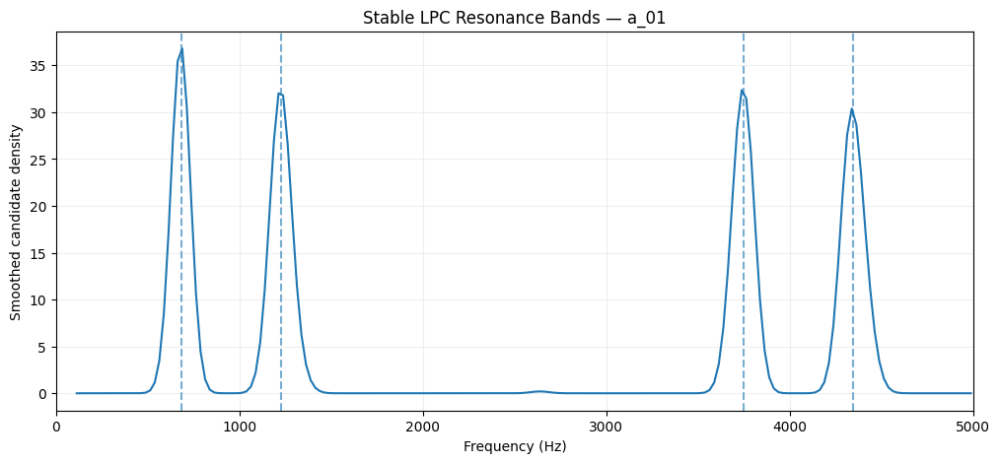

In [ ]:
plt.figure(
  figsize=(12, 5)
)


plt.plot(
  hist_freqs,
  smoothed_counts,
)


for freq in a_bands_df[
  "median_freq_hz"
]:
  plt.axvline(
    freq,
    linestyle="--",
    alpha=0.6,
  )


plt.xlabel(
  "Frequency (Hz)"
)

plt.ylabel(
  "Smoothed candidate density"
)

plt.title(
  "Stable LPC Resonance Bands — a_01"
)

plt.xlim(
  0,
  5000,
)

plt.grid(
  alpha=0.2
)


plt.show()

## 15. Stable Resonance Bands Across Vowels

The temporal LPC analysis is now applied to all five sustained vowels.

Each recording is analyzed using identical parameters.

Stable LPC resonance bands are summarized independently for each vowel.

The lowest stable resonance bands are then compared across vowels as potential F1 and F2 structures.

At this stage, the labels remain model-based formant estimates rather than direct physical measurements.

In [ ]:
all_bands = {}


for vowel in vowels:
  filename = (
    f"{vowel}_01.wav"
  )


  audio_path = (
    wav_dir / filename
  )


  wave_temp, sr_temp = sf.read(
    audio_path
  )


  candidates_temp = track_lpc_candidates(
    wave_temp,
    sr_temp,
    center_duration=2.0,
    target_sr=10000,
    frame_duration=0.03,
    hop_duration=0.01,
    order=12,
    max_bandwidth=500,
  )


  (
    bands_temp,
    hist_freqs_temp,
    smoothed_counts_temp,
  ) = summarize_resonance_bands(
    candidates_temp
  )


  all_bands[
    vowel
  ] = bands_temp


  print()
  print(
    f"/{vowel}/"
  )

  display(
    bands_temp.round({
      "peak_center_hz": 1,
      "median_freq_hz": 1,
      "freq_std_hz": 1,
      "median_bandwidth_hz": 1,
      "frame_coverage": 3,
    })
  )


/a/


,peak_center_hz,median_freq_hz,freq_std_hz,median_bandwidth_hz,frame_coverage,candidate_count
0,687.5,680.9,16.5,162.3,1.000,198
1,1212.5,1224.6,31.8,183.1,0.985,195
2,3737.5,3749.7,31.8,112.3,1.000,198
3,4337.5,4342.4,41.0,126.4,0.995,197



/e/


,peak_center_hz,median_freq_hz,freq_std_hz,median_bandwidth_hz,frame_coverage,candidate_count
0,537.5,551.6,16.2,182.8,1.000,198
1,1712.5,1717.7,16.0,84.8,1.000,198
2,2287.5,2283.4,55.5,307.3,0.889,176
3,3337.5,3330.7,36.4,296.9,0.692,137
4,4437.5,4448.5,35.9,135.4,0.995,197



/i/


,peak_center_hz,median_freq_hz,freq_std_hz,median_bandwidth_hz,frame_coverage,candidate_count
0,337.5,328.4,7.2,88.0,1.000,198
1,2187.5,2180.1,31.5,187.8,0.975,193
2,3387.5,3399.7,29.8,145.1,1.000,198
3,4387.5,4390.1,21.3,75.7,1.000,198



/o/


,peak_center_hz,median_freq_hz,freq_std_hz,median_bandwidth_hz,frame_coverage,candidate_count
0,412.5,407.2,12.9,161.1,1.000,198
1,787.5,794.2,19.7,147.5,1.000,198
2,2362.5,2370.4,57.9,179.2,0.899,178
3,4037.5,4037.0,31.1,146.2,0.990,196
4,4362.5,4368.2,40.2,324.5,0.712,141



/u/


,peak_center_hz,median_freq_hz,freq_std_hz,median_bandwidth_hz,frame_coverage,candidate_count
0,462.5,455.9,38.2,236.3,1.000,198
1,862.5,863.6,29.3,137.9,1.000,198
2,2262.5,2262.6,30.8,247.6,0.828,164
3,3262.5,3253.4,62.6,234.2,0.520,103
4,4187.5,4185.0,27.1,73.2,1.000,198


In [ ]:
formant_rows = []


for vowel in vowels:
  bands_df = all_bands[
    vowel
  ]


  stable_bands = bands_df[
    bands_df["frame_coverage"]
    >= 0.5
  ]


  stable_bands = (
    stable_bands
    .sort_values(
      "median_freq_hz"
    )
  )


  if len(stable_bands) < 2:
    print(
      f"Warning: /{vowel}/ has fewer than "
      "2 stable resonance bands."
    )
    continue


  f1 = stable_bands.iloc[0]
  f2 = stable_bands.iloc[1]


  formant_rows.append({
    "vowel": vowel,
    "F1_hz": f1[
      "median_freq_hz"
    ],
    "F1_std_hz": f1[
      "freq_std_hz"
    ],
    "F1_bandwidth_hz": f1[
      "median_bandwidth_hz"
    ],
    "F1_coverage": f1[
      "frame_coverage"
    ],
    "F2_hz": f2[
      "median_freq_hz"
    ],
    "F2_std_hz": f2[
      "freq_std_hz"
    ],
    "F2_bandwidth_hz": f2[
      "median_bandwidth_hz"
    ],
    "F2_coverage": f2[
      "frame_coverage"
    ],
  })


formant_df = pd.DataFrame(
  formant_rows
)


formant_df = formant_df.round({
  "F1_hz": 1,
  "F1_std_hz": 1,
  "F1_bandwidth_hz": 1,
  "F1_coverage": 3,
  "F2_hz": 1,
  "F2_std_hz": 1,
  "F2_bandwidth_hz": 1,
  "F2_coverage": 3,
})


display(
  formant_df
)

,vowel,F1_hz,F1_std_hz,F1_bandwidth_hz,F1_coverage,F2_hz,F2_std_hz,F2_bandwidth_hz,F2_coverage
0,a,680.9,16.5,162.3,1.0,1224.6,31.8,183.1,0.985
1,e,551.6,16.2,182.8,1.0,1717.7,16.0,84.8,1.000
2,i,328.4,7.2,88.0,1.0,2180.1,31.5,187.8,0.975
3,o,407.2,12.9,161.1,1.0,794.2,19.7,147.5,1.000
4,u,455.9,38.2,236.3,1.0,863.6,29.3,137.9,1.000


### 15.1 F1–F2 Vowel Space

The first two stable LPC resonance bands are visualized in the F1–F2 plane.

F1 and F2 are strongly associated with vowel articulation and are commonly used to represent vowel structure.

The current values are LPC-based estimates from a single speaker and should not be interpreted as universal vowel frequencies.

The purpose is to examine whether the recorded vowels occupy systematically different regions of formant space.

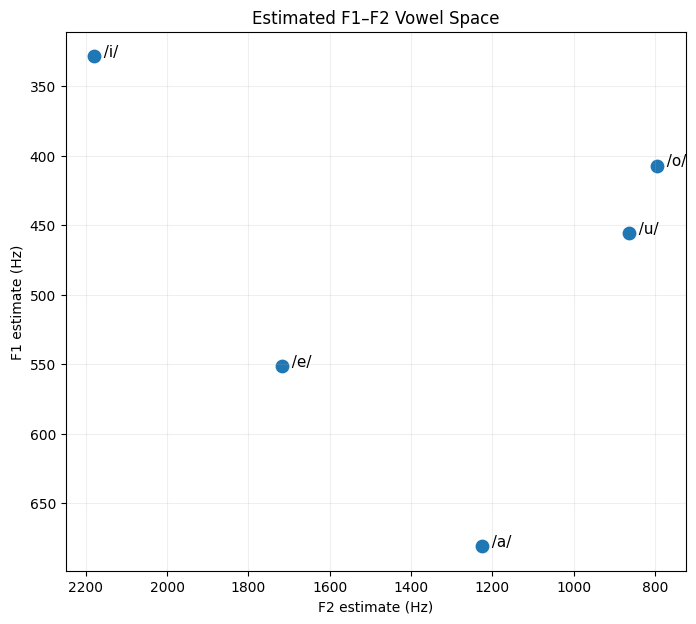

In [ ]:
plt.figure(
  figsize=(8, 7)
)


plt.scatter(
  formant_df["F2_hz"],
  formant_df["F1_hz"],
  s=80,
)


for _, row in formant_df.iterrows():
  plt.text(
    row["F2_hz"],
    row["F1_hz"],
    f"  /{row['vowel']}/",
    fontsize=11,
  )


plt.xlabel(
  "F2 estimate (Hz)"
)

plt.ylabel(
  "F1 estimate (Hz)"
)

plt.title(
  "Estimated F1–F2 Vowel Space"
)


plt.gca().invert_xaxis()
plt.gca().invert_yaxis()


plt.grid(
  alpha=0.2
)


plt.show()

## 16. Common Spectral Envelope

The five vowels contain both shared and vowel-dependent spectral structure.

As a first DeVowel model, we construct a common spectral envelope representing spectral characteristics that remain relatively consistent across vowels.

For each vowel:

1. the two recorded takes are analyzed,
2. their spectral envelopes are averaged,
3. the five vowel-average envelopes are compared.

The pointwise median across vowels is used as an exploratory common envelope.

The median is preferred here because strongly vowel-specific peaks in one vowel have less influence on the common target than they would with a simple mean.

This common envelope is not assumed to be a pure glottal-source spectrum or a physiologically neutral vocal tract.

It is an empirical spectral reference for the first DeVowel experiment.

In [ ]:
def build_common_vowel_envelope(
  wav_dir,
  vowels,
  takes=("01", "02"),
  min_freq=100,
  max_freq=5000,
  smoothing_sigma_hz=50,
):
  vowel_envelopes = {}

  reference_freqs = None


  for vowel in vowels:
    take_envelopes = []


    for take in takes:
      filename = (
        f"{vowel}_{take}.wav"
      )

      audio_path = (
        wav_dir / filename
      )


      wave_temp, sr_temp = sf.read(
        audio_path
      )


      freqs_temp, mag_db_temp = compute_spectrum(
        wave_temp,
        sr_temp,
      )


      envelope_temp = compute_spectral_envelope(
        freqs_temp,
        mag_db_temp,
        smoothing_sigma_hz=smoothing_sigma_hz,
      )


      mask = (
        (freqs_temp >= min_freq)
        & (freqs_temp <= max_freq)
      )


      freqs_roi = freqs_temp[
        mask
      ]

      envelope_roi = envelope_temp[
        mask
      ]


      if reference_freqs is None:
        reference_freqs = (
          freqs_roi
        )

      elif not np.allclose(
        freqs_roi,
        reference_freqs,
      ):
        raise ValueError(
          "Frequency axes are not identical."
        )


      take_envelopes.append(
        envelope_roi
      )


    take_envelopes = np.stack(
      take_envelopes,
      axis=0,
    )


    vowel_envelope = np.mean(
      take_envelopes,
      axis=0,
    )


    vowel_envelope = (
      vowel_envelope
      - np.max(vowel_envelope)
    )


    vowel_envelopes[
      vowel
    ] = vowel_envelope


  all_vowel_envelopes = np.stack(
    [
      vowel_envelopes[vowel]
      for vowel in vowels
    ],
    axis=0,
  )


  common_envelope = np.median(
    all_vowel_envelopes,
    axis=0,
  )


  common_envelope = (
    common_envelope
    - np.max(common_envelope)
  )


  return (
    reference_freqs,
    vowel_envelopes,
    common_envelope,
  )

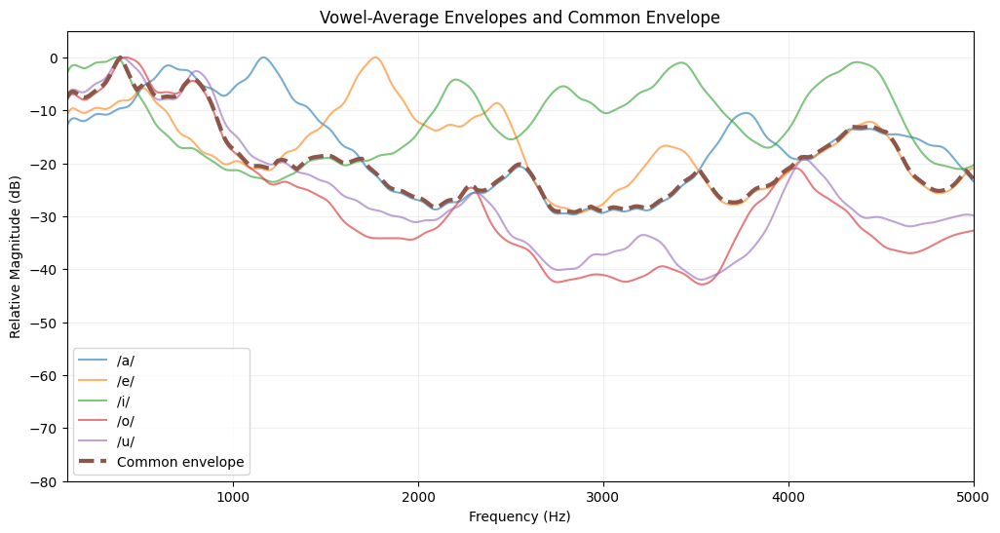

In [ ]:
(
  common_freqs,
  vowel_envelopes,
  common_envelope,
) = build_common_vowel_envelope(
  wav_dir,
  vowels,
)


plt.figure(
  figsize=(12, 6)
)


for vowel in vowels:
  plt.plot(
    common_freqs,
    vowel_envelopes[vowel],
    alpha=0.6,
    label=f"/{vowel}/",
  )


plt.plot(
  common_freqs,
  common_envelope,
  linewidth=3,
  linestyle="--",
  label="Common envelope",
)


plt.xlabel(
  "Frequency (Hz)"
)

plt.ylabel(
  "Relative Magnitude (dB)"
)

plt.title(
  "Vowel-Average Envelopes and Common Envelope"
)

plt.xlim(
  100,
  5000,
)

plt.ylim(
  -80,
  5,
)

plt.legend()

plt.grid(
  alpha=0.2
)


plt.show()

## 17. Vowel-Specific Spectral Deviation

The difference between each vowel envelope and the common envelope is treated as an exploratory vowel-dependent spectral component.

For vowel v:

D_v(f) = E_v(f) - E_common(f)

Positive values indicate frequency regions emphasized relative to the common envelope.

Negative values indicate frequency regions attenuated relative to the common envelope.

If vowel identity is strongly represented by these deviations, reducing them should move different vowels toward a more similar spectral shape.

This is the first direct DeVowel hypothesis tested through resynthesis.

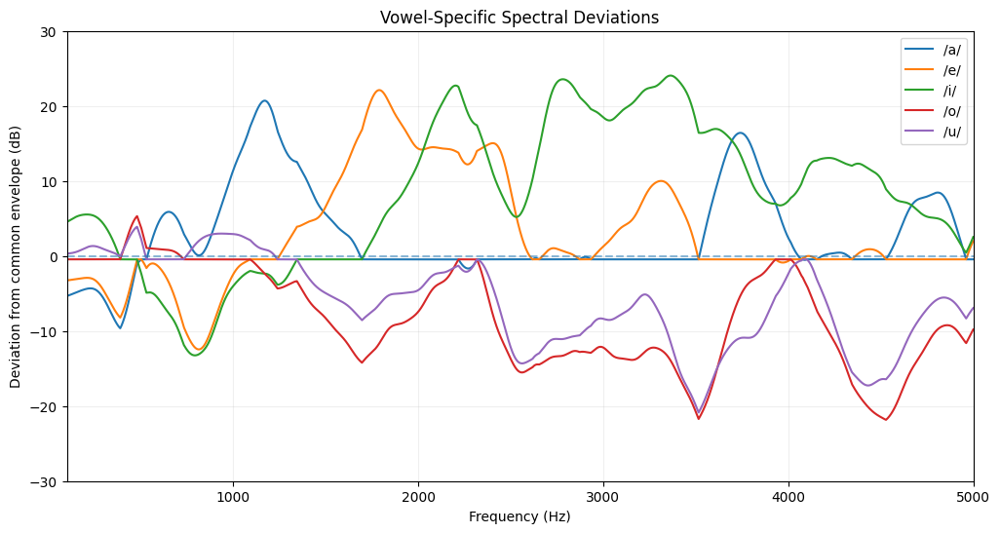

In [ ]:
vowel_deviations = {}


plt.figure(
  figsize=(12, 6)
)


for vowel in vowels:
  deviation_db = (
    vowel_envelopes[vowel]
    - common_envelope
  )


  vowel_deviations[
    vowel
  ] = deviation_db


  plt.plot(
    common_freqs,
    deviation_db,
    label=f"/{vowel}/",
  )


plt.axhline(
  0,
  linestyle="--",
  alpha=0.5,
)


plt.xlabel(
  "Frequency (Hz)"
)

plt.ylabel(
  "Deviation from common envelope (dB)"
)

plt.title(
  "Vowel-Specific Spectral Deviations"
)

plt.xlim(
  100,
  5000,
)

plt.ylim(
  -30,
  30,
)

plt.legend()

plt.grid(
  alpha=0.2
)


plt.show()

## 18. DeVowel v0.1: Static Spectral Neutralization

The first DeVowel resynthesis experiment applies the inverse of the vowel-specific spectral deviation.

For each vowel:

correction(f) =
strength × [common_envelope(f) - vowel_envelope(f)]

The correction is applied to the STFT magnitude spectrum while preserving the original complex phase.

A correction-strength parameter allows gradual neutralization.

The gain is also limited to avoid excessively large boosts or cuts.

This is a static spectral-shaping experiment designed for sustained vowels.

It is not yet a general source-filter separation algorithm and is not intended for continuous speech.

In [ ]:
def make_neutralization_curve(
  vowel_envelope,
  common_envelope,
  strength=0.5,
  max_correction_db=12,
):
  correction_db = (
    strength
    * (
      common_envelope
      - vowel_envelope
    )
  )


  correction_db = np.clip(
    correction_db,
    -max_correction_db,
    max_correction_db,
  )


  return correction_db

In [ ]:
def apply_static_spectral_correction(
  wave,
  sr,
  correction_freqs,
  correction_db,
  n_fft=4096,
  hop_length=512,
):
  spectrum_stft = librosa.stft(
    wave.astype(float),
    n_fft=n_fft,
    hop_length=hop_length,
    window="hann",
  )


  stft_freqs = librosa.fft_frequencies(
    sr=sr,
    n_fft=n_fft,
  )


  correction_interp_db = np.interp(
    stft_freqs,
    correction_freqs,
    correction_db,
    left=0.0,
    right=0.0,
  )


  gain = (
    10
    ** (
      correction_interp_db
      / 20
    )
  )


  corrected_stft = (
    spectrum_stft
    * gain[:, None]
  )


  corrected_wave = librosa.istft(
    corrected_stft,
    hop_length=hop_length,
    window="hann",
    length=len(wave),
  )


  peak = np.max(
    np.abs(corrected_wave)
  )


  if peak > 0.99:
    corrected_wave = (
      corrected_wave
      * (0.99 / peak)
    )


  return (
    corrected_wave,
    correction_interp_db,
  )

In [ ]:
test_vowels = [
  "a",
  "i",
]


processed_dir = (
  project_dir
  / "audio"
  / "processed"
  / "v0_1"
)


processed_dir.mkdir(
  parents=True,
  exist_ok=True,
)


for vowel in test_vowels:
  filename = (
    f"{vowel}_01.wav"
  )


  audio_path = (
    wav_dir / filename
  )


  wave_temp, sr_temp = sf.read(
    audio_path
  )


  print()
  print(
    f"1. Original /{vowel}/"
  )

  display(
    Audio(
      wave_temp,
      rate=sr_temp,
    )
  )


  for strength in [
    0.5,
    1.0,
  ]:
    correction_db = make_neutralization_curve(
      vowel_envelopes[vowel],
      common_envelope,
      strength=strength,
      max_correction_db=12,
    )


    (
      neutralized_wave,
      correction_interp_db,
    ) = apply_static_spectral_correction(
      wave_temp,
      sr_temp,
      common_freqs,
      correction_db,
    )


    percentage = int(
      strength * 100
    )


    print(
      f"{percentage}% neutralized /{vowel}/"
    )


    display(
      Audio(
        neutralized_wave,
        rate=sr_temp,
      )
    )


    output_path = (
      processed_dir
      / (
        f"{vowel}_01_"
        f"neutral_{percentage}.wav"
      )
    )


    sf.write(
      output_path,
      neutralized_wave,
      sr_temp,
    )


    print(
      "Saved:",
      output_path.name
    )


1. Original /a/


50% neutralized /a/


Saved: a_01_neutral_50.wav
100% neutralized /a/


Saved: a_01_neutral_100.wav

1. Original /i/


50% neutralized /i/


Saved: i_01_neutral_50.wav
100% neutralized /i/


Saved: i_01_neutral_100.wav


## 21. Measuring the DeVowel Effect

Listening suggests that spectral neutralization reduces vowel identifiability while preserving a clearly human vocal quality.

Before increasing the correction strength, the processed signals are analyzed again.

The goal is to determine whether the spectral envelope of each processed vowel actually moves toward the common target envelope.

For each signal, we measure:

- envelope distance from the common target before processing,
- envelope distance after processing,
- correlation with the common target.

This separates perceptual observations from the actual spectral effect of the algorithm.

In [ ]:
def measure_envelope_distance(
  wave,
  sr,
  common_freqs,
  common_envelope,
):
  freqs, mag_db = compute_spectrum(
    wave,
    sr,
  )


  envelope_db = compute_spectral_envelope(
    freqs,
    mag_db,
    smoothing_sigma_hz=50,
  )


  mask = (
    (freqs >= common_freqs[0])
    & (freqs <= common_freqs[-1])
  )


  freqs_roi = freqs[
    mask
  ]

  envelope_roi = envelope_db[
    mask
  ]


  target_interp = np.interp(
    freqs_roi,
    common_freqs,
    common_envelope,
  )


  mae_db = np.mean(
    np.abs(
      envelope_roi
      - target_interp
    )
  )


  correlation = np.corrcoef(
    envelope_roi,
    target_interp,
  )[0, 1]


  return (
    mae_db,
    correlation,
    freqs_roi,
    envelope_roi,
    target_interp,
  )

In [ ]:
measurement_rows = []


for vowel in [
  "a",
  "i",
]:
  original_path = (
    wav_dir
    / f"{vowel}_01.wav"
  )


  wave_original, sr_original = sf.read(
    original_path
  )


  (
    mae_original,
    corr_original,
    _,
    _,
    _,
  ) = measure_envelope_distance(
    wave_original,
    sr_original,
    common_freqs,
    common_envelope,
  )


  measurement_rows.append({
    "vowel": vowel,
    "version": "original",
    "mae_to_common_db": mae_original,
    "corr_to_common": corr_original,
  })


  for percentage in [
    50,
    100,
  ]:
    processed_path = (
      processed_dir
      / (
        f"{vowel}_01_"
        f"neutral_{percentage}.wav"
      )
    )


    wave_processed, sr_processed = sf.read(
      processed_path
    )


    (
      mae_processed,
      corr_processed,
      _,
      _,
      _,
    ) = measure_envelope_distance(
      wave_processed,
      sr_processed,
      common_freqs,
      common_envelope,
    )


    measurement_rows.append({
      "vowel": vowel,
      "version": f"neutral_{percentage}",
      "mae_to_common_db": mae_processed,
      "corr_to_common": corr_processed,
    })


measurement_df = pd.DataFrame(
  measurement_rows
)


measurement_df = measurement_df.round({
  "mae_to_common_db": 2,
  "corr_to_common": 3,
})


display(
  measurement_df
)

,vowel,version,mae_to_common_db,corr_to_common
0,a,original,5.04,0.714
1,a,neutral_50,3.97,0.868
2,a,neutral_100,3.04,0.930
3,i,original,9.83,0.126
4,i,neutral_50,5.29,0.729
5,i,neutral_100,3.51,0.818


## 22. Steady-State Listening Comparison

The attack portion of the recordings contains strong temporal articulation cues.

To evaluate the effect of spectral neutralization independently from onset articulation, a short central segment is extracted from each original and processed recording.

This comparison focuses on the sustained steady-state portion of the vowel.

The attack-inclusive and steady-state listening tests answer different questions:

- full recording: how much total vowel articulation remains?
- steady-state segment: how much stationary spectral vowel identity remains?

In [ ]:
def extract_center_segment(
  wave,
  sr,
  duration=1.5,
):
  center_sample = (
    len(wave) // 2
  )


  half_length = int(
    duration
    * sr
    / 2
  )


  start = max(
    0,
    center_sample - half_length,
  )

  end = min(
    len(wave),
    center_sample + half_length,
  )


  return wave[
    start:end
  ]

In [ ]:
stimulus_number = 1


for vowel in [
  "a",
  "i",
]:
  print()
  print(
    f"=== /{vowel}/ ==="
  )


  original_path = (
    wav_dir
    / f"{vowel}_01.wav"
  )


  wave_original, sr_original = sf.read(
    original_path
  )


  center_original = extract_center_segment(
    wave_original,
    sr_original,
  )


  print(
    f"{stimulus_number}. Original steady-state /{vowel}/"
  )

  display(
    Audio(
      center_original,
      rate=sr_original,
    )
  )

  stimulus_number += 1


  for percentage in [
    50,
    100,
  ]:
    processed_path = (
      processed_dir
      / (
        f"{vowel}_01_"
        f"neutral_{percentage}.wav"
      )
    )


    wave_processed, sr_processed = sf.read(
      processed_path
    )


    center_processed = extract_center_segment(
      wave_processed,
      sr_processed,
    )


    print(
      f"{stimulus_number}. "
      f"{percentage}% neutralized "
      f"steady-state /{vowel}/"
    )


    display(
      Audio(
        center_processed,
        rate=sr_processed,
      )
    )


    stimulus_number += 1


=== /a/ ===
1. Original steady-state /a/


2. 50% neutralized steady-state /a/


3. 100% neutralized steady-state /a/



=== /i/ ===
4. Original steady-state /i/


5. 50% neutralized steady-state /i/


6. 100% neutralized steady-state /i/


## 23. Convergence Across All Vowels

The previous analysis confirmed that neutralized /a/ and /i/ move toward the common spectral target.

The next question is more directly related to DeVowel:

Do different vowels become more similar to one another after neutralization?

All five vowels are processed using the same common-envelope method.

Pairwise spectral-envelope distances are then compared between:

- original vowels,
- 50% neutralization,
- 100% neutralization.

If vowel-dependent structure is being reduced, average between-vowel distance should decrease as neutralization strength increases.

In [ ]:
all_processed = {}


for vowel in vowels:
  filename = (
    f"{vowel}_01.wav"
  )

  audio_path = (
    wav_dir / filename
  )

  wave_temp, sr_temp = sf.read(
    audio_path
  )


  all_processed[
    (vowel, "original")
  ] = (
    wave_temp,
    sr_temp,
  )


  for strength in [
    0.5,
    1.0,
  ]:
    correction_db = make_neutralization_curve(
      vowel_envelopes[vowel],
      common_envelope,
      strength=strength,
      max_correction_db=12,
    )


    (
      corrected_wave,
      correction_interp_db,
    ) = apply_static_spectral_correction(
      wave_temp,
      sr_temp,
      common_freqs,
      correction_db,
    )


    percentage = int(
      strength * 100
    )


    all_processed[
      (
        vowel,
        f"neutral_{percentage}",
      )
    ] = (
      corrected_wave,
      sr_temp,
    )


    output_path = (
      processed_dir
      / (
        f"{vowel}_01_"
        f"neutral_{percentage}.wav"
      )
    )


    sf.write(
      output_path,
      corrected_wave,
      sr_temp,
    )


print(
  "Stored versions:",
  len(all_processed),
)

Stored versions: 15


In [ ]:
processed_envelopes = {}


for key, (
  wave_temp,
  sr_temp,
) in all_processed.items():
  freqs_temp, mag_db_temp = compute_spectrum(
    wave_temp,
    sr_temp,
  )


  envelope_temp = compute_spectral_envelope(
    freqs_temp,
    mag_db_temp,
    smoothing_sigma_hz=50,
  )


  mask = (
    (freqs_temp >= common_freqs[0])
    & (freqs_temp <= common_freqs[-1])
  )


  freqs_roi = freqs_temp[
    mask
  ]

  envelope_roi = envelope_temp[
    mask
  ]


  if not np.allclose(
    freqs_roi,
    common_freqs,
  ):
    envelope_roi = np.interp(
      common_freqs,
      freqs_roi,
      envelope_roi,
    )


  processed_envelopes[
    key
  ] = envelope_roi


print(
  "Stored envelopes:",
  len(processed_envelopes),
)

Stored envelopes: 15


### 25.1 Pairwise Vowel Convergence

Each pair of different vowels is compared within the same processing condition.

For each pair, two measurements are calculated:

- Pearson correlation between spectral envelopes,
- mean absolute error (MAE) between spectral envelopes.

Successful vowel neutralization should produce:

- higher pairwise correlation,
- lower pairwise MAE.

This directly tests whether different vowels converge toward a more similar spectral shape.

In [ ]:
versions = [
  "original",
  "neutral_50",
  "neutral_100",
]


convergence_rows = []


for version in versions:
  for i in range(
    len(vowels)
  ):
    for j in range(
      i + 1,
      len(vowels)
    ):
      vowel_a = vowels[i]
      vowel_b = vowels[j]


      envelope_a = processed_envelopes[
        (
          vowel_a,
          version,
        )
      ]


      envelope_b = processed_envelopes[
        (
          vowel_b,
          version,
        )
      ]


      corr = np.corrcoef(
        envelope_a,
        envelope_b,
      )[0, 1]


      mae_db = np.mean(
        np.abs(
          envelope_a
          - envelope_b
        )
      )


      convergence_rows.append({
        "version": version,
        "vowel_a": vowel_a,
        "vowel_b": vowel_b,
        "correlation": corr,
        "mae_db": mae_db,
      })


convergence_df = pd.DataFrame(
  convergence_rows
)


display(
  convergence_df.round({
    "correlation": 3,
    "mae_db": 2,
  })
)

,version,vowel_a,vowel_b,correlation,mae_db
0,original,a,e,0.084,9.38
1,original,a,i,-0.283,12.21
2,original,a,o,0.684,12.14
3,original,a,u,0.617,8.81
4,original,e,i,0.146,9.20
5,original,e,o,0.423,13.56
6,original,e,u,0.524,9.71
7,original,i,o,-0.033,18.18
8,original,i,u,0.063,14.67
9,original,o,u,0.904,4.95


In [ ]:
convergence_summary_df = (
  convergence_df
  .groupby(
    "version"
  )[
    [
      "correlation",
      "mae_db",
    ]
  ]
  .mean()
  .reindex(
    versions
  )
  .round(3)
)


display(
  convergence_summary_df
)

,correlation,mae_db
version,,
original,0.313,11.282
neutral_50,0.715,6.833
neutral_100,0.829,3.701


## 27. Cross-Take Validation

The previous DeVowel experiment used both takes of each vowel to construct the spectral reference.

This means that the evaluated recording contributed partially to the reference used to transform it.

To test whether the vowel-neutralization pattern generalizes across repeated recordings, the two takes are now separated.

Two experiments are performed:

1. construct the reference from take 01 and process take 02,
2. construct the reference from take 02 and process take 01.

The test recording is therefore not used to construct the vowel-specific correction applied to it.

If between-vowel spectral convergence remains strong under this cross-take evaluation, the correction is capturing repeatable vowel-dependent structure rather than merely fitting an individual recording.

In [ ]:
(
  freqs_ref_01,
  vowel_envelopes_01,
  common_envelope_01,
) = build_common_vowel_envelope(
  wav_dir,
  vowels,
  takes=("01",),
)


(
  freqs_ref_02,
  vowel_envelopes_02,
  common_envelope_02,
) = build_common_vowel_envelope(
  wav_dir,
  vowels,
  takes=("02",),
)


print(
  "Take-specific references ready."
)

print(
  "Frequency bins:",
  len(freqs_ref_01),
)

Take-specific references ready.
Frequency bins: 9801


In [ ]:
def process_test_take(
  reference_vowel_envelopes,
  reference_common_envelope,
  reference_freqs,
  test_take,
  strength,
  max_correction_db=12,
):
  results = {}


  for vowel in vowels:
    audio_path = (
      wav_dir
      / f"{vowel}_{test_take}.wav"
    )


    wave_temp, sr_temp = sf.read(
      audio_path
    )


    if strength == 0:
      corrected_wave = (
        wave_temp.copy()
      )

    else:
      correction_db = make_neutralization_curve(
        reference_vowel_envelopes[vowel],
        reference_common_envelope,
        strength=strength,
        max_correction_db=max_correction_db,
      )


      (
        corrected_wave,
        _,
      ) = apply_static_spectral_correction(
        wave_temp,
        sr_temp,
        reference_freqs,
        correction_db,
      )


    results[vowel] = (
      corrected_wave,
      sr_temp,
    )


  return results

In [ ]:
def measure_pairwise_convergence(
  processed_results,
):
  envelope_results = {}


  for vowel in vowels:
    (
      wave_temp,
      sr_temp,
    ) = processed_results[
      vowel
    ]


    freqs_temp, mag_db_temp = compute_spectrum(
      wave_temp,
      sr_temp,
    )


    envelope_temp = compute_spectral_envelope(
      freqs_temp,
      mag_db_temp,
      smoothing_sigma_hz=50,
    )


    mask = (
      (freqs_temp >= 100)
      & (freqs_temp <= 5000)
    )


    envelope_results[
      vowel
    ] = envelope_temp[
      mask
    ]


  pair_corrs = []
  pair_maes = []


  for i in range(
    len(vowels)
  ):
    for j in range(
      i + 1,
      len(vowels)
    ):
      envelope_a = envelope_results[
        vowels[i]
      ]

      envelope_b = envelope_results[
        vowels[j]
      ]


      corr = np.corrcoef(
        envelope_a,
        envelope_b,
      )[0, 1]


      mae = np.mean(
        np.abs(
          envelope_a
          - envelope_b
        )
      )


      pair_corrs.append(
        corr
      )

      pair_maes.append(
        mae
      )


  return (
    np.mean(pair_corrs),
    np.mean(pair_maes),
  )

In [ ]:
cross_validation_rows = []


experiments = [
  (
    "01",
    "02",
    vowel_envelopes_01,
    common_envelope_01,
    freqs_ref_01,
  ),
  (
    "02",
    "01",
    vowel_envelopes_02,
    common_envelope_02,
    freqs_ref_02,
  ),
]


for (
  reference_take,
  test_take,
  reference_vowels,
  reference_common,
  reference_freqs,
) in experiments:

  for strength in [
    0.0,
    0.5,
    1.0,
  ]:
    processed_results = process_test_take(
      reference_vowels,
      reference_common,
      reference_freqs,
      test_take=test_take,
      strength=strength,
      max_correction_db=12,
    )


    (
      corr,
      mae_db,
    ) = measure_pairwise_convergence(
      processed_results
    )


    if strength == 0:
      version = "original"

    elif strength == 0.5:
      version = "neutral_50"

    else:
      version = "neutral_100"


    cross_validation_rows.append({
      "reference_take": reference_take,
      "test_take": test_take,
      "version": version,
      "correlation": corr,
      "mae_db": mae_db,
    })


cross_validation_df = pd.DataFrame(
  cross_validation_rows
)


display(
  cross_validation_df.round({
    "correlation": 3,
    "mae_db": 3,
  })
)

,reference_take,test_take,version,correlation,mae_db
0,01,02,original,0.272,11.949
1,01,02,neutral_50,0.602,8.529
2,01,02,neutral_100,0.669,5.924
3,02,01,original,0.313,11.282
4,02,01,neutral_50,0.636,7.240
5,02,01,neutral_100,0.707,5.142


In [ ]:
cross_validation_summary_df = (
  cross_validation_df
  .groupby(
    "version"
  )[
    [
      "correlation",
      "mae_db",
    ]
  ]
  .mean()
  .reindex([
    "original",
    "neutral_50",
    "neutral_100",
  ])
  .round(3)
)


display(
  cross_validation_summary_df
)

,correlation,mae_db
version,,
original,0.293,11.616
neutral_50,0.619,7.885
neutral_100,0.688,5.533


## 28. Correction-Cap Sweep

Cross-take validation confirmed that vowel-specific spectral correction generalizes to repeated recordings that were not used to construct the reference.

The current 100% neutralization condition still limits spectral correction to ±12 dB.

However, several vowel-specific deviations exceed this range.

The correction limit is therefore varied while keeping neutralization strength fixed at 1.0.

Conditions:

- original,
- ±12 dB,
- ±18 dB,
- ±24 dB.

For each condition, cross-take between-vowel convergence is measured using:

- mean pairwise spectral-envelope correlation,
- mean pairwise spectral-envelope MAE.

Only one parameter is changed in this experiment so that the effect of correction magnitude can be interpreted clearly.

In [ ]:
cap_values = [
  12,
  18,
  24,
]


cap_sweep_rows = []


experiments = [
  (
    "01",
    "02",
    vowel_envelopes_01,
    common_envelope_01,
    freqs_ref_01,
  ),
  (
    "02",
    "01",
    vowel_envelopes_02,
    common_envelope_02,
    freqs_ref_02,
  ),
]


for (
  reference_take,
  test_take,
  reference_vowels,
  reference_common,
  reference_freqs,
) in experiments:

  original_results = process_test_take(
    reference_vowels,
    reference_common,
    reference_freqs,
    test_take=test_take,
    strength=0.0,
    max_correction_db=12,
  )


  (
    corr_original,
    mae_original,
  ) = measure_pairwise_convergence(
    original_results
  )


  cap_sweep_rows.append({
    "reference_take": reference_take,
    "test_take": test_take,
    "condition": "original",
    "cap_db": 0,
    "correlation": corr_original,
    "mae_db": mae_original,
  })


  for cap_db in cap_values:
    processed_results = process_test_take(
      reference_vowels,
      reference_common,
      reference_freqs,
      test_take=test_take,
      strength=1.0,
      max_correction_db=cap_db,
    )


    (
      corr,
      mae_db,
    ) = measure_pairwise_convergence(
      processed_results
    )


    cap_sweep_rows.append({
      "reference_take": reference_take,
      "test_take": test_take,
      "condition": f"cap_{cap_db}",
      "cap_db": cap_db,
      "correlation": corr,
      "mae_db": mae_db,
    })


cap_sweep_df = pd.DataFrame(
  cap_sweep_rows
)


display(
  cap_sweep_df.round({
    "correlation": 3,
    "mae_db": 3,
  })
)

,reference_take,test_take,condition,cap_db,correlation,mae_db
0,01,02,original,0,0.272,11.949
1,01,02,cap_12,12,0.669,5.924
2,01,02,cap_18,18,0.703,5.426
3,01,02,cap_24,24,0.694,5.521
4,02,01,original,0,0.313,11.282
5,02,01,cap_12,12,0.707,5.142
6,02,01,cap_18,18,0.697,5.131
7,02,01,cap_24,24,0.680,5.371


In [ ]:
cap_summary_df = (
  cap_sweep_df
  .groupby(
    [
      "condition",
      "cap_db",
    ]
  )[
    [
      "correlation",
      "mae_db",
    ]
  ]
  .mean()
  .reset_index()
  .sort_values(
    "cap_db"
  )
)


cap_summary_df = cap_summary_df.round({
  "correlation": 3,
  "mae_db": 3,
})


display(
  cap_summary_df
)

,condition,cap_db,correlation,mae_db
3,original,0,0.293,11.616
0,cap_12,12,0.688,5.533
1,cap_18,18,0.700,5.279
2,cap_24,24,0.687,5.446


In [ ]:
original_mae = (
  cap_summary_df
  .loc[
    cap_summary_df["cap_db"] == 0,
    "mae_db",
  ]
  .iloc[0]
)


cap_summary_df[
  "mae_reduction_percent"
] = (
  100
  * (
    original_mae
    - cap_summary_df["mae_db"]
  )
  / original_mae
)


cap_summary_df[
  "mae_reduction_percent"
] = (
  cap_summary_df[
    "mae_reduction_percent"
  ]
  .round(1)
)


display(
  cap_summary_df
)

,condition,cap_db,correlation,mae_db,mae_reduction_percent
3,original,0,0.293,11.616,0.0
0,cap_12,12,0.688,5.533,52.4
1,cap_18,18,0.700,5.279,54.6
2,cap_24,24,0.687,5.446,53.1


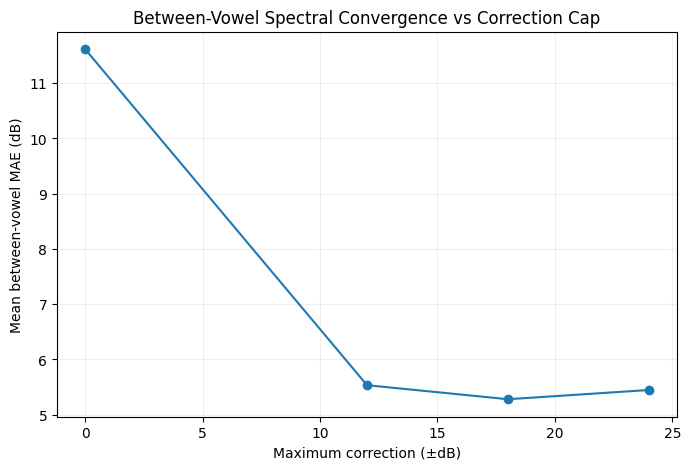

In [ ]:
plt.figure(
  figsize=(8, 5)
)


plt.plot(
  cap_summary_df["cap_db"],
  cap_summary_df["mae_db"],
  marker="o",
)


plt.xlabel(
  "Maximum correction (±dB)"
)

plt.ylabel(
  "Mean between-vowel MAE (dB)"
)

plt.title(
  "Between-Vowel Spectral Convergence vs Correction Cap"
)

plt.grid(
  alpha=0.2
)


plt.show()

## 29. Blind Steady-State Listening Test

A blind self-listening test is used to reduce expectation bias.

Only the central steady-state portion of each vowel is presented.

Stimulus labels do not reveal:

- vowel identity,
- correction condition.

For each stimulus, listeners may judge:

1. perceived vowel, if identifiable,
2. confidence in vowel identification,
3. preservation of human vocal character,
4. audible processing artifacts.

The answer key is displayed only after listening judgments have been recorded.

In [ ]:
rng = np.random.default_rng(
  20260904
)


blind_conditions = [
  ("original", 0),
  ("cap_12", 12),
  ("cap_18", 18),
  ("cap_24", 24),
]


blind_stimuli = []


for vowel in vowels:
  audio_path = (
    wav_dir
    / f"{vowel}_02.wav"
  )


  wave_temp, sr_temp = sf.read(
    audio_path
  )


  for condition, cap_db in blind_conditions:

    if condition == "original":
      processed_wave = (
        wave_temp.copy()
      )

    else:
      correction_db = make_neutralization_curve(
        vowel_envelopes_01[vowel],
        common_envelope_01,
        strength=1.0,
        max_correction_db=cap_db,
      )


      (
        processed_wave,
        _,
      ) = apply_static_spectral_correction(
        wave_temp,
        sr_temp,
        freqs_ref_01,
        correction_db,
      )


    center_wave = extract_center_segment(
      processed_wave,
      sr_temp,
      duration=1.2,
    )


    rms = np.sqrt(
      np.mean(
        center_wave ** 2
      )
    )


    if rms > 0:
      center_wave = (
        center_wave
        * (0.08 / rms)
      )


    peak = np.max(
      np.abs(center_wave)
    )


    if peak > 0.99:
      center_wave = (
        center_wave
        * (0.99 / peak)
      )


    blind_stimuli.append({
      "vowel": vowel,
      "condition": condition,
      "wave": center_wave,
      "sr": sr_temp,
    })


rng.shuffle(
  blind_stimuli
)


print(
  "Blind stimuli:",
  len(blind_stimuli),
)

Blind stimuli: 20


In [ ]:
for idx, stimulus in enumerate(
  blind_stimuli,
  start=1,
):
  print(
    f"{idx}. Stimulus"
  )


  display(
    Audio(
      stimulus["wave"],
      rate=stimulus["sr"],
    )
  )

1. Stimulus


2. Stimulus


3. Stimulus


4. Stimulus


5. Stimulus


6. Stimulus


7. Stimulus


8. Stimulus


9. Stimulus


10. Stimulus


11. Stimulus


12. Stimulus


13. Stimulus


14. Stimulus


15. Stimulus


16. Stimulus


17. Stimulus


18. Stimulus


19. Stimulus


20. Stimulus


In [ ]:
answer_rows = []


for idx, stimulus in enumerate(
  blind_stimuli,
  start=1,
):
  answer_rows.append({
    "stimulus": idx,
    "vowel": stimulus[
      "vowel"
    ],
    "condition": stimulus[
      "condition"
    ],
  })


blind_answer_df = pd.DataFrame(
  answer_rows
)


display(
  blind_answer_df
)

,stimulus,vowel,condition
0,1,u,cap_18
1,2,i,original
2,3,i,cap_18
3,4,u,cap_24
4,5,a,cap_12
5,6,o,cap_24
6,7,a,cap_18
7,8,a,cap_24
8,9,o,original
9,10,i,cap_12


## 30. Blind Steady-State Listening Results

A blind self-listening test was performed using the central 1.2-second steady-state portion of each recording.

Four conditions were evaluated:

- original,
- ±12 dB correction,
- ±18 dB correction,
- ±24 dB correction.

For each stimulus, vowel identity, vowel identifiability, vowel-like quality, and audible artifacts were recorded.

Human vocal quality was omitted from numerical scoring because every stimulus was clearly perceived as a human voice.

The results suggest that stronger correction progressively reduces both vowel identifiability and vowel-like quality.

However, categorical vowel identification does not decrease monotonically, and several processed vowels converge perceptually toward other vowel categories rather than toward a clearly vowel-neutral percept.

This indicates that spectral convergence and perceptual vowel suppression are related but not equivalent.

In [ ]:
blind_results = [
  [1,  "u", "cap_18",  "o", 3, 4, False],
  [2,  "i", "original", "i", 5, 5, False],
  [3,  "i", "cap_18",  "i", 1, 3, True],
  [4,  "u", "cap_24",  "o", 3, 3, False],
  [5,  "a", "cap_12",  "a", 5, 5, False],
  [6,  "o", "cap_24",  "o", 1, 1, False],
  [7,  "a", "cap_18",  "a", 4, 4, False],
  [8,  "a", "cap_24",  "a", 4, 4, False],
  [9,  "o", "original", "o", 3, 3, False],
  [10, "i", "cap_12",  "i", 4, 4, False],
  [11, "i", "cap_24",  "i", 2, 4, False],
  [12, "e", "cap_18",  "a", 4, 3, False],
  [13, "e", "cap_12",  "a", 3, 4, False],
  [14, "o", "cap_18",  "o", 2, 4, True],
  [15, "u", "cap_12",  "o", 2, 3, True],
  [16, "o", "cap_12",  "o", 2, 3, True],
  [17, "a", "original", "a", 5, 5, False],
  [18, "e", "cap_24",  "a", 2, 3, False],
  [19, "u", "original", "o", 2, 3, False],
  [20, "e", "original", "e", 5, 5, False],
]


blind_results_df = pd.DataFrame(
  blind_results,
  columns=[
    "stimulus",
    "true_vowel",
    "condition",
    "estimated_vowel",
    "identifiability",
    "vowel_like",
    "artifact",
  ],
)


blind_results_df[
  "correct"
] = (
  blind_results_df["true_vowel"]
  == blind_results_df["estimated_vowel"]
)


display(
  blind_results_df
)

,stimulus,true_vowel,condition,estimated_vowel,identifiability,vowel_like,artifact,correct
0,1,u,cap_18,o,3,4,False,False
1,2,i,original,i,5,5,False,True
2,3,i,cap_18,i,1,3,True,True
3,4,u,cap_24,o,3,3,False,False
4,5,a,cap_12,a,5,5,False,True
5,6,o,cap_24,o,1,1,False,True
6,7,a,cap_18,a,4,4,False,True
7,8,a,cap_24,a,4,4,False,True
8,9,o,original,o,3,3,False,True
9,10,i,cap_12,i,4,4,False,True


In [ ]:
condition_order = [
  "original",
  "cap_12",
  "cap_18",
  "cap_24",
]


blind_summary_df = (
  blind_results_df
  .groupby(
    "condition"
  )
  .agg(
    accuracy=(
      "correct",
      "mean",
    ),
    mean_identifiability=(
      "identifiability",
      "mean",
    ),
    mean_vowel_like=(
      "vowel_like",
      "mean",
    ),
    artifact_count=(
      "artifact",
      "sum",
    ),
  )
  .reindex(
    condition_order
  )
)


blind_summary_df[
  "accuracy_percent"
] = (
  100
  * blind_summary_df[
    "accuracy"
  ]
)


blind_summary_df = blind_summary_df[
  [
    "accuracy_percent",
    "mean_identifiability",
    "mean_vowel_like",
    "artifact_count",
  ]
].round(2)


display(
  blind_summary_df
)

,accuracy_percent,mean_identifiability,mean_vowel_like,artifact_count
condition,,,,
original,80.0,4.0,4.2,0
cap_12,60.0,3.2,3.8,2
cap_18,60.0,2.8,3.6,2
cap_24,60.0,2.4,3.0,0


## 31. Residual Vowel Structure After Neutralization

Blind listening indicates that stronger spectral correction reduces vowel identifiability, but several vowels remain perceptually associated with stable vowel categories.

To investigate the remaining cues, the spectral envelopes of processed signals are compared with the common target envelope.

The residual deviation is defined as:

residual(f) =
processed_envelope(f) - common_envelope(f)

A successful neutralization should reduce the magnitude of this residual.

Frequency regions where large residual deviations remain are candidates for surviving vowel-dependent spectral information.

In [ ]:
residual_envelopes = {}


for vowel in vowels:
  audio_path = (
    wav_dir
    / f"{vowel}_02.wav"
  )


  wave_temp, sr_temp = sf.read(
    audio_path
  )


  correction_db = make_neutralization_curve(
    vowel_envelopes_01[vowel],
    common_envelope_01,
    strength=1.0,
    max_correction_db=24,
  )


  (
    processed_wave,
    _,
  ) = apply_static_spectral_correction(
    wave_temp,
    sr_temp,
    freqs_ref_01,
    correction_db,
  )


  freqs_temp, mag_db_temp = compute_spectrum(
    processed_wave,
    sr_temp,
  )


  envelope_temp = compute_spectral_envelope(
    freqs_temp,
    mag_db_temp,
    smoothing_sigma_hz=50,
  )


  mask = (
    (freqs_temp >= 100)
    & (freqs_temp <= 5000)
  )


  freqs_roi = freqs_temp[
    mask
  ]

  envelope_roi = envelope_temp[
    mask
  ]


  target_interp = np.interp(
    freqs_roi,
    freqs_ref_01,
    common_envelope_01,
  )


  residual_envelopes[
    vowel
  ] = (
    envelope_roi
    - target_interp
  )


residual_freqs = freqs_roi

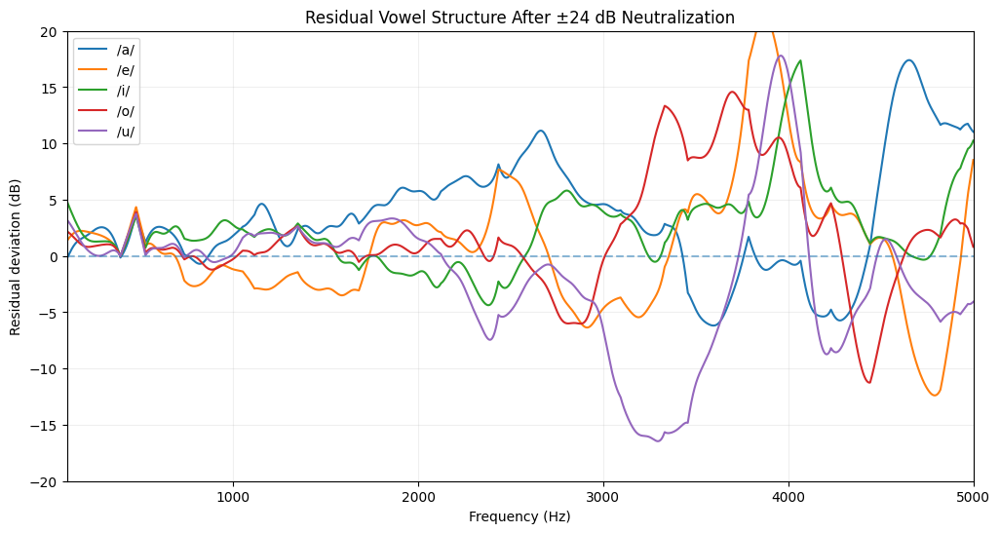

In [ ]:
plt.figure(
  figsize=(12, 6)
)


for vowel in vowels:
  plt.plot(
    residual_freqs,
    residual_envelopes[vowel],
    label=f"/{vowel}/",
  )


plt.axhline(
  0,
  linestyle="--",
  alpha=0.5,
)


plt.xlabel(
  "Frequency (Hz)"
)

plt.ylabel(
  "Residual deviation (dB)"
)

plt.title(
  "Residual Vowel Structure After ±24 dB Neutralization"
)

plt.xlim(
  100,
  5000,
)

plt.ylim(
  -20,
  20,
)

plt.legend()

plt.grid(
  alpha=0.2
)


plt.show()

## 32. Residual-Error Decomposition

The ±24 dB residual is separated into three possible sources:

1. frequency-region dependence,
2. correction clipping,
3. cross-take mismatch.

The main question is whether the remaining residual comes from insufficient correction strength or from differences between repeated productions of the same vowel.


In [ ]:
frequency_regions = {
  "low_100_1000": (
    100,
    1000,
  ),
  "mid_1000_2500": (
    1000,
    2500,
  ),
  "high_2500_5000": (
    2500,
    5000,
  ),
}


residual_region_rows = []


for vowel in vowels:
  residual = residual_envelopes[
    vowel
  ]


  for region_name, (
    freq_min,
    freq_max,
  ) in frequency_regions.items():

    region_mask = (
      (residual_freqs >= freq_min)
      & (residual_freqs < freq_max)
    )


    mae_db = np.mean(
      np.abs(
        residual[
          region_mask
        ]
      )
    )


    residual_region_rows.append({
      "vowel": vowel,
      "region": region_name,
      "residual_mae_db": mae_db,
    })


residual_region_df = pd.DataFrame(
  residual_region_rows
)


display(
  residual_region_df.round({
    "residual_mae_db": 2,
  })
)


residual_region_summary_df = (
  residual_region_df
  .groupby(
    "region"
  )[
    "residual_mae_db"
  ]
  .mean()
  .reindex([
    "low_100_1000",
    "mid_1000_2500",
    "high_2500_5000",
  ])
  .to_frame()
  .round(2)
)


display(
  residual_region_summary_df
)


,vowel,region,residual_mae_db
0,a,low_100_1000,1.47
1,a,mid_1000_2500,4.39
2,a,high_2500_5000,6.07
3,e,low_100_1000,1.57
4,e,mid_1000_2500,2.61
5,e,high_2500_5000,6.14
6,i,low_100_1000,1.96
7,i,mid_1000_2500,1.77
8,i,high_2500_5000,4.39
9,o,low_100_1000,0.96


,residual_mae_db
region,
low_100_1000,1.36
mid_1000_2500,2.42
high_2500_5000,5.92


In [ ]:
clipping_rows = []


for vowel in vowels:
  intended_correction = (
    common_envelope_01
    - vowel_envelopes_01[
      vowel
    ]
  )


  clipped_mask = (
    np.abs(
      intended_correction
    )
    > 24
  )


  clip_fraction = np.mean(
    clipped_mask
  )


  if np.any(
    clipped_mask
  ):
    mean_excess_db = np.mean(
      np.abs(
        intended_correction[
          clipped_mask
        ]
      )
      - 24
    )

  else:
    mean_excess_db = 0.0


  clipping_rows.append({
    "vowel": vowel,
    "max_requested_db": np.max(
      np.abs(
        intended_correction
      )
    ),
    "clipped_fraction": clip_fraction,
    "mean_excess_db": mean_excess_db,
  })


clipping_df = pd.DataFrame(
  clipping_rows
)


clipping_df[
  "clipped_percent"
] = (
  100
  * clipping_df[
    "clipped_fraction"
  ]
)


display(
  clipping_df[
    [
      "vowel",
      "max_requested_db",
      "clipped_percent",
      "mean_excess_db",
    ]
  ].round(2)
)


,vowel,max_requested_db,clipped_percent,mean_excess_db
0,a,25.23,1.28,0.69
1,e,22.24,0.00,0.00
2,i,24.33,0.89,0.22
3,o,25.33,1.06,0.66
4,u,16.61,0.00,0.00


In [ ]:
take_mismatches = {}


for vowel in vowels:
  take_mismatches[
    vowel
  ] = (
    vowel_envelopes_02[
      vowel
    ]
    - vowel_envelopes_01[
      vowel
    ]
  )


residual_prediction_rows = []
predicted_residuals = {}


for vowel in vowels:
  intended_correction = (
    common_envelope_01
    - vowel_envelopes_01[
      vowel
    ]
  )


  applied_correction = np.clip(
    intended_correction,
    -24,
    24,
  )


  clipping_error = (
    applied_correction
    - intended_correction
  )


  predicted_residual = (
    take_mismatches[
      vowel
    ]
    + clipping_error
  )


  predicted_residuals[
    vowel
  ] = predicted_residual


  actual_residual = residual_envelopes[
    vowel
  ]


  prediction_corr = np.corrcoef(
    actual_residual,
    predicted_residual,
  )[0, 1]


  prediction_mae = np.mean(
    np.abs(
      actual_residual
      - predicted_residual
    )
  )


  mismatch_mae = np.mean(
    np.abs(
      take_mismatches[
        vowel
      ]
    )
  )


  residual_prediction_rows.append({
    "vowel": vowel,
    "take_mismatch_mae_db": mismatch_mae,
    "prediction_corr": prediction_corr,
    "prediction_error_mae_db": prediction_mae,
  })


residual_prediction_df = pd.DataFrame(
  residual_prediction_rows
)


display(
  residual_prediction_df.round({
    "take_mismatch_mae_db": 2,
    "prediction_corr": 3,
    "prediction_error_mae_db": 2,
  })
)


,vowel,take_mismatch_mae_db,prediction_corr,prediction_error_mae_db
0,a,3.77,0.992,3.26
1,e,4.21,0.993,0.69
2,i,2.45,0.983,1.74
3,o,3.19,0.993,1.22
4,u,4.84,0.996,1.35


## 33. Common-Envelope Target Bias

The pointwise median across vowels is an empirical common spectral target, not a guaranteed perceptually neutral vocal-tract state.

Distances from each vowel template to the common envelope are therefore measured for both takes.


In [ ]:
target_bias_rows = []


reference_sets = [
  (
    "01",
    vowel_envelopes_01,
    common_envelope_01,
  ),
  (
    "02",
    vowel_envelopes_02,
    common_envelope_02,
  ),
]


for (
  take,
  vowel_envelopes_temp,
  common_temp,
) in reference_sets:

  for vowel in vowels:
    vowel_envelope = vowel_envelopes_temp[
      vowel
    ]


    mae_db = np.mean(
      np.abs(
        vowel_envelope
        - common_temp
      )
    )


    corr = np.corrcoef(
      vowel_envelope,
      common_temp,
    )[0, 1]


    target_bias_rows.append({
      "take": take,
      "vowel": vowel,
      "mae_to_common_db": mae_db,
      "corr_to_common": corr,
    })


target_bias_df = pd.DataFrame(
  target_bias_rows
)


display(
  target_bias_df.round({
    "mae_to_common_db": 2,
    "corr_to_common": 3,
  })
)


target_bias_summary_df = (
  target_bias_df
  .groupby(
    "vowel"
  )[
    [
      "mae_to_common_db",
      "corr_to_common",
    ]
  ]
  .mean()
  .sort_values(
    "mae_to_common_db"
  )
  .round(3)
)


display(
  target_bias_summary_df
)


,take,vowel,mae_to_common_db,corr_to_common
0,01,a,5.05,0.669
1,01,e,5.89,0.557
2,01,i,10.49,0.135
3,01,o,8.17,0.870
4,01,u,4.49,0.922
5,02,a,4.58,0.646
6,02,e,5.30,0.575
7,02,i,10.05,0.106
8,02,o,8.16,0.861
9,02,u,8.39,0.855


,mae_to_common_db,corr_to_common
vowel,,
a,4.819,0.657
e,5.592,0.566
u,6.439,0.888
o,8.163,0.865
i,10.270,0.121


## 34. Oracle Static Neutralization

The oracle condition uses the test recording's own spectral envelope to construct its correction toward the common target.

This is intentionally not a deployable method.

Its purpose is to estimate the upper bound of the current static spectral-neutralization architecture and to test whether cross-take envelope mismatch is the primary limitation.


In [ ]:
oracle_vowel_envelopes = {}


for vowel in vowels:
  audio_path = (
    wav_dir
    / f"{vowel}_02.wav"
  )


  wave_temp, sr_temp = sf.read(
    audio_path
  )


  freqs_temp, mag_db_temp = compute_spectrum(
    wave_temp,
    sr_temp,
  )


  envelope_temp = compute_spectral_envelope(
    freqs_temp,
    mag_db_temp,
    smoothing_sigma_hz=50,
  )


  mask = (
    (freqs_temp >= 100)
    & (freqs_temp <= 5000)
  )


  oracle_vowel_envelopes[
    vowel
  ] = envelope_temp[
    mask
  ]


oracle_freqs = freqs_temp[
  mask
]


oracle_results = {}


for vowel in vowels:
  audio_path = (
    wav_dir
    / f"{vowel}_02.wav"
  )


  wave_temp, sr_temp = sf.read(
    audio_path
  )


  target_common = np.interp(
    oracle_freqs,
    freqs_ref_01,
    common_envelope_01,
  )


  correction_db = (
    target_common
    - oracle_vowel_envelopes[
      vowel
    ]
  )


  (
    oracle_wave,
    _,
  ) = apply_static_spectral_correction(
    wave_temp,
    sr_temp,
    oracle_freqs,
    correction_db,
  )


  oracle_results[
    vowel
  ] = (
    oracle_wave,
    sr_temp,
  )


(
  oracle_corr,
  oracle_mae,
) = measure_pairwise_convergence(
  oracle_results
)


oracle_summary_df = pd.DataFrame([
  {
    "condition": "original",
    "correlation": 0.293,
    "mae_db": 11.616,
  },
  {
    "condition": "cross_take_24",
    "correlation": 0.687,
    "mae_db": 5.446,
  },
  {
    "condition": "oracle_static",
    "correlation": oracle_corr,
    "mae_db": oracle_mae,
  },
])


display(
  oracle_summary_df.round({
    "correlation": 3,
    "mae_db": 3,
  })
)


,condition,correlation,mae_db
0,original,0.293,11.616
1,cross_take_24,0.687,5.446
2,oracle_static,0.995,0.868


## 35. Adaptive Spectral Neutralization

Static DeVowel uses a precomputed vowel template.

Adaptive DeVowel instead estimates the spectral envelope of each current STFT frame and computes a frame-specific correction toward the common target.

Frequency smoothing estimates the broad spectral envelope.

Time smoothing reduces abrupt frame-to-frame correction changes.

This is an offline adaptive prototype, not yet a causal real-time system.


In [ ]:
def apply_adaptive_spectral_neutralization(
  wave,
  sr,
  target_freqs,
  target_envelope_db,
  strength=1.0,
  max_correction_db=18,
  smoothing_sigma_hz=50,
  time_smoothing_ms=50,
  min_freq=100,
  max_freq=5000,
  n_fft=4096,
  hop_length=512,
):
  stft = librosa.stft(
    wave.astype(float),
    n_fft=n_fft,
    hop_length=hop_length,
    window="hann",
  )


  stft_freqs = librosa.fft_frequencies(
    sr=sr,
    n_fft=n_fft,
  )


  mag = np.abs(
    stft
  )


  mag_db = (
    20
    * np.log10(
      mag + 1e-12
    )
  )


  bin_spacing_hz = (
    stft_freqs[1]
    - stft_freqs[0]
  )


  sigma_freq_bins = (
    smoothing_sigma_hz
    / bin_spacing_hz
  )


  frame_envelopes_db = gaussian_filter1d(
    mag_db,
    sigma=sigma_freq_bins,
    axis=0,
  )


  roi_mask = (
    (stft_freqs >= min_freq)
    & (stft_freqs <= max_freq)
  )


  roi_envelopes_db = frame_envelopes_db[
    roi_mask,
    :
  ]


  roi_envelopes_db = (
    roi_envelopes_db
    - np.max(
      roi_envelopes_db,
      axis=0,
      keepdims=True,
    )
  )


  target_roi_db = np.interp(
    stft_freqs[
      roi_mask
    ],
    target_freqs,
    target_envelope_db,
  )


  correction_roi_db = (
    strength
    * (
      target_roi_db[:, None]
      - roi_envelopes_db
    )
  )


  hop_duration_s = (
    hop_length
    / sr
  )


  sigma_time_frames = (
    (time_smoothing_ms / 1000)
    / hop_duration_s
  )


  correction_roi_db = gaussian_filter1d(
    correction_roi_db,
    sigma=sigma_time_frames,
    axis=1,
  )


  correction_roi_db = np.clip(
    correction_roi_db,
    -max_correction_db,
    max_correction_db,
  )


  correction_db = np.zeros_like(
    mag_db
  )


  correction_db[
    roi_mask,
    :
  ] = correction_roi_db


  gain = (
    10
    ** (
      correction_db
      / 20
    )
  )


  corrected_stft = (
    stft
    * gain
  )


  corrected_wave = librosa.istft(
    corrected_stft,
    hop_length=hop_length,
    window="hann",
    length=len(wave),
  )


  original_rms = np.sqrt(
    np.mean(
      wave ** 2
    )
  )


  corrected_rms = np.sqrt(
    np.mean(
      corrected_wave ** 2
    )
  )


  if corrected_rms > 0:
    corrected_wave = (
      corrected_wave
      * (
        original_rms
        / corrected_rms
      )
    )


  peak = np.max(
    np.abs(
      corrected_wave
    )
  )


  if peak > 0.99:
    corrected_wave = (
      corrected_wave
      * (
        0.99 / peak
      )
    )


  return (
    corrected_wave,
    correction_db,
    frame_envelopes_db,
  )


In [ ]:
adaptive_all_results = {}


for vowel in vowels:
  audio_path = (
    wav_dir
    / f"{vowel}_02.wav"
  )


  wave_temp, sr_temp = sf.read(
    audio_path
  )


  (
    adaptive_wave,
    _,
    _,
  ) = apply_adaptive_spectral_neutralization(
    wave_temp,
    sr_temp,
    freqs_ref_01,
    common_envelope_01,
    strength=1.0,
    max_correction_db=18,
    smoothing_sigma_hz=50,
    time_smoothing_ms=50,
  )


  adaptive_all_results[
    vowel
  ] = (
    adaptive_wave,
    sr_temp,
  )


(
  adaptive_corr,
  adaptive_mae,
) = measure_pairwise_convergence(
  adaptive_all_results
)


static_18_results = process_test_take(
  vowel_envelopes_01,
  common_envelope_01,
  freqs_ref_01,
  test_take="02",
  strength=1.0,
  max_correction_db=18,
)


(
  static_18_corr,
  static_18_mae,
) = measure_pairwise_convergence(
  static_18_results
)


adaptive_comparison_df = pd.DataFrame([
  {
    "condition": "original",
    "correlation": 0.272,
    "mae_db": 11.949,
  },
  {
    "condition": "static_cross_take_18",
    "correlation": static_18_corr,
    "mae_db": static_18_mae,
  },
  {
    "condition": "adaptive_18",
    "correlation": adaptive_corr,
    "mae_db": adaptive_mae,
  },
  {
    "condition": "oracle_static",
    "correlation": oracle_corr,
    "mae_db": oracle_mae,
  },
])


display(
  adaptive_comparison_df.round({
    "correlation": 3,
    "mae_db": 3,
  })
)


,condition,correlation,mae_db
0,original,0.272,11.949
1,static_cross_take_18,0.703,5.426
2,adaptive_18,0.952,1.718
3,oracle_static,0.995,0.868


## 36. Temporal DeVowel Analysis

Listening indicated that residual articulation was most noticeable near the vocal onset.

The recordings are therefore aligned to a detected voice onset and analyzed relative to that point.

The onset detector uses frame-wise RMS as a simple energy criterion.


In [ ]:
def detect_voice_onset(
  wave,
  sr,
  frame_duration=0.02,
  hop_duration=0.005,
  threshold_db=-30,
  min_consecutive=3,
):
  frame_length = int(
    frame_duration
    * sr
  )

  hop_length = int(
    hop_duration
    * sr
  )


  rms = librosa.feature.rms(
    y=wave.astype(float),
    frame_length=frame_length,
    hop_length=hop_length,
    center=True,
  )[0]


  rms_db = (
    20
    * np.log10(
      rms
      / (
        np.max(rms)
        + 1e-12
      )
      + 1e-12
    )
  )


  active = (
    rms_db
    >= threshold_db
  )


  for idx in range(
    0,
    len(active)
    - min_consecutive
    + 1,
  ):
    if np.all(
      active[
        idx:
        idx + min_consecutive
      ]
    ):
      return (
        idx
        * hop_length
        / sr
      )


  return 0.0


onset_times = {}


for vowel in vowels:
  wave_temp, sr_temp = sf.read(
    wav_dir
    / f"{vowel}_02.wav"
  )


  onset_times[
    vowel
  ] = detect_voice_onset(
    wave_temp,
    sr_temp,
  )


  print(
    f"/{vowel}/ onset: "
    f"{onset_times[vowel]:.3f} s"
  )


/a/ onset: 0.125 s
/e/ onset: 0.045 s
/i/ onset: 0.140 s
/o/ onset: 0.195 s
/u/ onset: 0.095 s


In [ ]:
def extract_onset_relative_segment(
  wave,
  sr,
  onset_s,
  start_after_onset,
  end_after_onset,
):
  start_sample = int(
    (
      onset_s
      + start_after_onset
    )
    * sr
  )


  end_sample = int(
    (
      onset_s
      + end_after_onset
    )
    * sr
  )


  start_sample = max(
    0,
    start_sample,
  )


  end_sample = min(
    len(wave),
    end_sample,
  )


  return wave[
    start_sample:
    end_sample
  ]


def compute_segment_envelope(
  segment,
  sr,
  smoothing_sigma_hz=50,
):
  segment = (
    segment
    - np.mean(segment)
  )


  window = np.hanning(
    len(segment)
  )


  windowed = (
    segment
    * window
  )


  spectrum = np.fft.rfft(
    windowed
  )


  mag = np.abs(
    spectrum
  )


  freqs = np.fft.rfftfreq(
    len(windowed),
    d=1 / sr,
  )


  mag_db = (
    20
    * np.log10(
      mag + 1e-12
    )
  )


  mag_db = (
    mag_db
    - np.max(
      mag_db
    )
  )


  envelope_db = compute_spectral_envelope(
    freqs,
    mag_db,
    smoothing_sigma_hz=smoothing_sigma_hz,
  )


  return (
    freqs,
    envelope_db,
  )


## 37. Attack vs Steady-State Convergence

Three onset-relative regions are compared:

- attack: 0.00–0.30 s,
- transition: 0.30–0.80 s,
- steady state: 1.00–2.00 s.

The same onset alignment is used for the original and adaptive signals.


In [ ]:
temporal_regions = {
  "attack_0_300ms": (
    0.0,
    0.3,
  ),
  "transition_300_800ms": (
    0.3,
    0.8,
  ),
  "steady_1000_2000ms": (
    1.0,
    2.0,
  ),
}


def build_temporal_region_envelopes(
  results,
  onset_times,
  region_start,
  region_end,
  analysis_freqs,
):
  envelopes = {}


  for vowel in vowels:
    (
      wave_temp,
      sr_temp,
    ) = results[
      vowel
    ]


    segment = extract_onset_relative_segment(
      wave_temp,
      sr_temp,
      onset_times[
        vowel
      ],
      region_start,
      region_end,
    )


    freqs_temp, envelope_temp = compute_segment_envelope(
      segment,
      sr_temp,
      smoothing_sigma_hz=50,
    )


    envelope_interp = np.interp(
      analysis_freqs,
      freqs_temp,
      envelope_temp,
    )


    envelopes[
      vowel
    ] = envelope_interp


  return envelopes


def measure_envelope_set_convergence(
  envelope_set,
):
  correlations = []
  maes = []


  for i in range(
    len(vowels)
  ):
    for j in range(
      i + 1,
      len(vowels)
    ):
      envelope_a = envelope_set[
        vowels[i]
      ]

      envelope_b = envelope_set[
        vowels[j]
      ]


      corr = np.corrcoef(
        envelope_a,
        envelope_b,
      )[0, 1]


      mae = np.mean(
        np.abs(
          envelope_a
          - envelope_b
        )
      )


      correlations.append(
        corr
      )

      maes.append(
        mae
      )


  return (
    np.mean(
      correlations
    ),
    np.mean(
      maes
    ),
  )


original_take_02_results = {}


for vowel in vowels:
  wave_temp, sr_temp = sf.read(
    wav_dir
    / f"{vowel}_02.wav"
  )


  original_take_02_results[
    vowel
  ] = (
    wave_temp,
    sr_temp,
  )


temporal_analysis_freqs = np.arange(
  100,
  5001,
  5,
)


temporal_rows = []


conditions = {
  "original": original_take_02_results,
  "adaptive": adaptive_all_results,
}


for region_name, (
  region_start,
  region_end,
) in temporal_regions.items():

  for condition_name, results in conditions.items():

    region_envelopes = build_temporal_region_envelopes(
      results,
      onset_times,
      region_start,
      region_end,
      temporal_analysis_freqs,
    )


    (
      correlation,
      mae_db,
    ) = measure_envelope_set_convergence(
      region_envelopes
    )


    temporal_rows.append({
      "region": region_name,
      "condition": condition_name,
      "correlation": correlation,
      "mae_db": mae_db,
    })


temporal_convergence_df = pd.DataFrame(
  temporal_rows
)


display(
  temporal_convergence_df.round({
    "correlation": 3,
    "mae_db": 3,
  })
)


,region,condition,correlation,mae_db
0,attack_0_300ms,original,0.350,12.836
1,attack_0_300ms,adaptive,0.961,2.421
2,transition_300_800ms,original,0.307,9.951
3,transition_300_800ms,adaptive,0.975,1.217
4,steady_1000_2000ms,original,0.255,11.422
5,steady_1000_2000ms,adaptive,0.964,1.373


## 38. Time-Resolved Vowel Convergence

A 100 ms analysis window is moved in 20 ms steps from the detected onset.

At each time position, mean pairwise spectral-envelope distance is measured across the five vowels.

This reveals whether residual vowel differences are concentrated in the earliest onset region.


In [ ]:
window_duration = 0.10
step_duration = 0.02


window_starts = np.arange(
  0.0,
  2.0
  - window_duration
  + 1e-9,
  step_duration,
)


time_curve_rows = []


for condition_name, results in conditions.items():

  for window_start in window_starts:
    window_end = (
      window_start
      + window_duration
    )


    region_envelopes = build_temporal_region_envelopes(
      results,
      onset_times,
      window_start,
      window_end,
      temporal_analysis_freqs,
    )


    (
      corr,
      mae_db,
    ) = measure_envelope_set_convergence(
      region_envelopes
    )


    time_curve_rows.append({
      "condition": condition_name,
      "time_s": (
        window_start
        + window_duration / 2
      ),
      "correlation": corr,
      "mae_db": mae_db,
    })


time_curve_df = pd.DataFrame(
  time_curve_rows
)


print(
  "Rows:",
  len(time_curve_df),
)


display(
  time_curve_df.head()
)


Rows: 192


,condition,time_s,correlation,mae_db
0,original,0.05,0.620073,14.393148
1,original,0.07,0.521014,16.170769
2,original,0.09,0.444439,15.444243
3,original,0.11,0.376405,13.016359
4,original,0.13,0.387851,12.011269


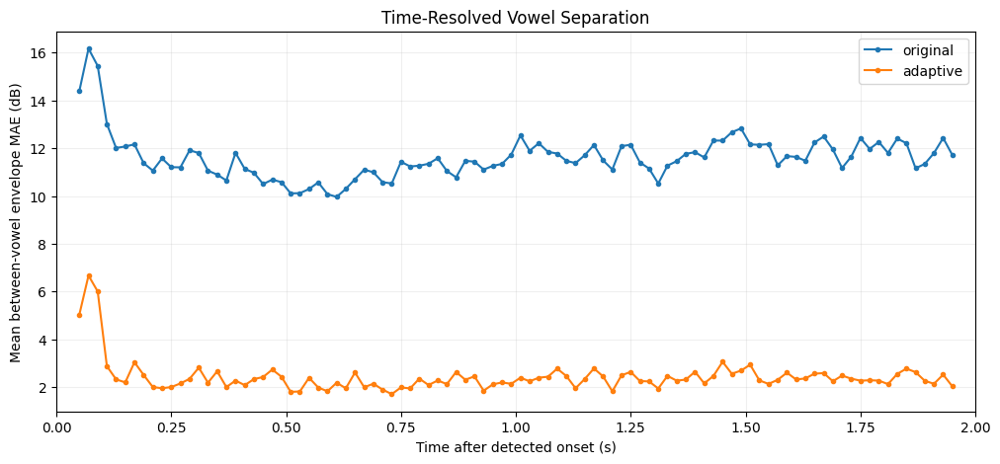

In [ ]:
plt.figure(
  figsize=(12, 5)
)


for condition_name in [
  "original",
  "adaptive",
]:
  condition_df = time_curve_df[
    time_curve_df[
      "condition"
    ] == condition_name
  ]


  plt.plot(
    condition_df[
      "time_s"
    ],
    condition_df[
      "mae_db"
    ],
    marker="o",
    markersize=3,
    label=condition_name,
  )


plt.xlabel(
  "Time after detected onset (s)"
)

plt.ylabel(
  "Mean between-vowel envelope MAE (dB)"
)

plt.title(
  "Time-Resolved Vowel Separation"
)

plt.xlim(
  0,
  2.0,
)

plt.legend()

plt.grid(
  alpha=0.2,
)


plt.show()


## 39. DeVowel → ReVowel

Adaptive DeVowel has shown that different sustained vowels can be transformed toward a highly similar vowel-normalized spectral state while preserving a clearly human voice quality.

The next experiment reverses this process.

A single vowel-normalized voice carrier is used to synthesize multiple target vowels.

Two resynthesis methods are compared:

### Method A — Reusable articulation curve

A vowel articulation curve is defined as:

vowel articulation = vowel envelope - common envelope

The articulation curve is independent of the current carrier.

If this method succeeds, vowel-dependent spectral structure can be treated as a reusable component that can be removed from one voice signal and reapplied to another vowel-normalized carrier.

### Method B — Direct target matching

The current carrier envelope is measured and directly corrected toward the desired vowel envelope.

This method is used as a control condition.

The long-term goal is not merely vowel conversion, but a voice-synthesis architecture in which voice identity and articulation can be manipulated as partially independent dimensions.

## 40. Single Neutral Voice Carrier

A single adaptive-DeVowel signal is selected as the carrier for every ReVowel output.

The carrier originates from `a_02`, but the first 500 ms after detected vocal onset are discarded to reduce residual articulation from the original /a/ attack.

The segment from 0.5 to 2.0 seconds after onset is used.

Using one identical carrier keeps the following factors approximately constant across all synthesized vowels:

- fundamental frequency,
- harmonic timing,
- source waveform,
- speaker-dependent voice characteristics,
- duration.

The primary manipulated variable is the spectral articulation curve.

In [ ]:
carrier_source_vowel = "a"


(
  carrier_full,
  carrier_sr,
) = adaptive_all_results[
  carrier_source_vowel
]


carrier_wave = extract_onset_relative_segment(
  carrier_full,
  carrier_sr,
  onset_times[
    carrier_source_vowel
  ],
  start_after_onset=0.5,
  end_after_onset=2.0,
)


print(
  "Carrier source:",
  "a_02"
)

print(
  "Carrier duration:",
  f"{len(carrier_wave) / carrier_sr:.3f} s"
)

print(
  "Carrier sample rate:",
  carrier_sr,
  "Hz"
)


print()
print(
  "1. Vowel-normalized carrier"
)


display(
  Audio(
    carrier_wave,
    rate=carrier_sr,
  )
)

Carrier source: a_02
Carrier duration: 1.500 s
Carrier sample rate: 44100 Hz

1. Vowel-normalized carrier


## 41. Reusable Vowel Articulation Curves

For each vowel, an articulation curve is defined from take 01:

A_v(f) = E_v(f) - C(f)

where:

- E_v(f) is the spectral envelope of vowel v,
- C(f) is the common vowel envelope,
- A_v(f) is the vowel-specific spectral deviation.

Positive values indicate frequency regions that should be boosted relative to the common carrier.

Negative values indicate regions that should be attenuated.

These curves are empirical spectral articulation templates.

They are not yet physical vocal-tract transfer functions.

In [ ]:
articulation_curves_01 = {}


for vowel in vowels:
  articulation_curves_01[
    vowel
  ] = (
    vowel_envelopes_01[
      vowel
    ]
    - common_envelope_01
  )

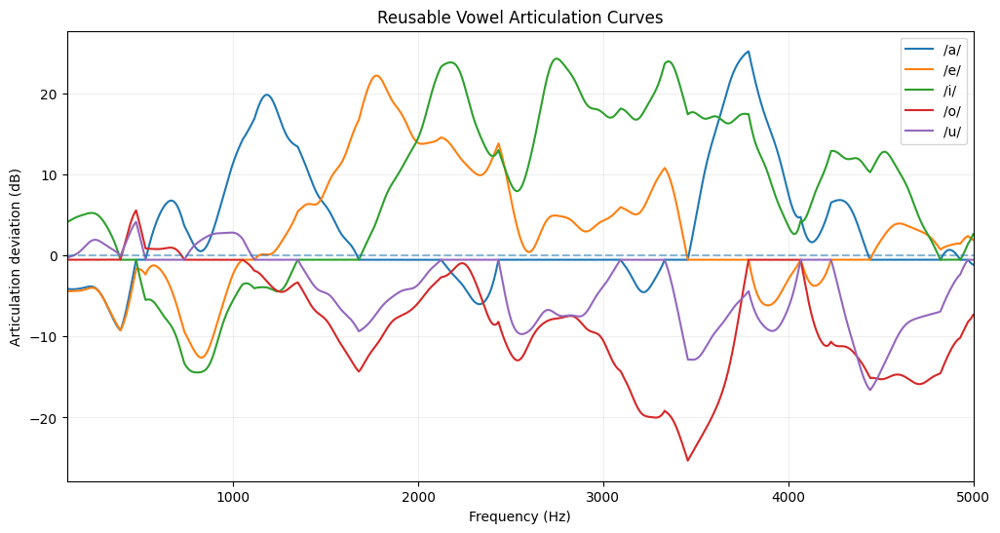

In [ ]:
plt.figure(
  figsize=(12, 6)
)


for vowel in vowels:
  plt.plot(
    freqs_ref_01,
    articulation_curves_01[
      vowel
    ],
    label=f"/{vowel}/",
  )


plt.axhline(
  0,
  linestyle="--",
  alpha=0.5,
)


plt.xlabel(
  "Frequency (Hz)"
)

plt.ylabel(
  "Articulation deviation (dB)"
)

plt.title(
  "Reusable Vowel Articulation Curves"
)

plt.xlim(
  100,
  5000,
)

plt.legend()

plt.grid(
  alpha=0.2,
)


plt.show()

In [ ]:
def match_rms(
  reference_wave,
  target_wave,
):
  reference_rms = np.sqrt(
    np.mean(
      reference_wave ** 2
    )
  )


  target_rms = np.sqrt(
    np.mean(
      target_wave ** 2
    )
  )


  if target_rms <= 0:
    return target_wave.copy()


  matched_wave = (
    target_wave
    * (
      reference_rms
      / target_rms
    )
  )


  peak = np.max(
    np.abs(
      matched_wave
    )
  )


  if peak > 0.99:
    matched_wave = (
      matched_wave
      * (
        0.99 / peak
      )
    )


  return matched_wave

## 43. Method A — Reusable Articulation Resynthesis

The same vowel-normalized carrier is filtered using the reusable articulation curves derived from take 01.

No measurement of the current carrier is used to construct the vowel curve.

Therefore:

carrier + A_a → synthesized /a/

carrier + A_e → synthesized /e/

carrier + A_i → synthesized /i/

carrier + A_o → synthesized /o/

carrier + A_u → synthesized /u/

Success in this condition would support the hypothesis that vowel-dependent spectral articulation can be represented as a reusable component separate from the underlying carrier.

In [ ]:
def apply_revowel_articulation(
  carrier_wave,
  sr,
  articulation_freqs,
  articulation_db,
  strength=1.0,
  max_articulation_db=24,
):
  applied_db = (
    strength
    * articulation_db
  )


  applied_db = np.clip(
    applied_db,
    -max_articulation_db,
    max_articulation_db,
  )


  (
    articulated_wave,
    _,
  ) = apply_static_spectral_correction(
    carrier_wave,
    sr,
    articulation_freqs,
    applied_db,
  )


  articulated_wave = match_rms(
    carrier_wave,
    articulated_wave,
  )


  return articulated_wave

In [ ]:
revowel_a_results = {}


for vowel in vowels:
  articulated_wave = apply_revowel_articulation(
    carrier_wave,
    carrier_sr,
    freqs_ref_01,
    articulation_curves_01[
      vowel
    ],
    strength=1.0,
    max_articulation_db=24,
  )


  revowel_a_results[
    vowel
  ] = (
    articulated_wave,
    carrier_sr,
  )


print(
  "0. Neutral carrier"
)

print(
  "Same source used for every output."
)

display(
  Audio(
    carrier_wave,
    rate=carrier_sr,
  )
)


for index, vowel in enumerate(
  vowels,
  start=1,
):
  (
    articulated_wave,
    sr_temp,
  ) = revowel_a_results[
    vowel
  ]


  print()
  print(
    f"{index}. Method A target /{vowel}/"
  )

  print(
    "Reusable articulation curve "
    "applied to the same carrier."
  )


  display(
    Audio(
      articulated_wave,
      rate=sr_temp,
    )
  )

0. Neutral carrier
Same source used for every output.



1. Method A target /a/
Reusable articulation curve applied to the same carrier.



2. Method A target /e/
Reusable articulation curve applied to the same carrier.



3. Method A target /i/
Reusable articulation curve applied to the same carrier.



4. Method A target /o/
Reusable articulation curve applied to the same carrier.



5. Method A target /u/
Reusable articulation curve applied to the same carrier.


In [ ]:
def compute_output_envelope(
  wave,
  sr,
  analysis_freqs,
  smoothing_sigma_hz=50,
):
  duration_s = (
    len(wave)
    / sr
  )


  freqs_temp, mag_db_temp = compute_spectrum(
    wave,
    sr,
    center_duration=duration_s,
  )


  envelope_temp = compute_spectral_envelope(
    freqs_temp,
    mag_db_temp,
    smoothing_sigma_hz=smoothing_sigma_hz,
  )


  envelope_interp = np.interp(
    analysis_freqs,
    freqs_temp,
    envelope_temp,
  )


  return envelope_interp

In [ ]:
def measure_revowel_target_matching(
  revowel_results,
  target_envelopes,
  analysis_freqs,
):
  rows = []


  output_envelopes = {}


  for synth_vowel in vowels:
    (
      wave_temp,
      sr_temp,
    ) = revowel_results[
      synth_vowel
    ]


    output_envelopes[
      synth_vowel
    ] = compute_output_envelope(
      wave_temp,
      sr_temp,
      analysis_freqs,
    )


  for synth_vowel in vowels:
    synth_envelope = output_envelopes[
      synth_vowel
    ]


    for target_vowel in vowels:
      target_envelope = target_envelopes[
        target_vowel
      ]


      mae_db = np.mean(
        np.abs(
          synth_envelope
          - target_envelope
        )
      )


      correlation = np.corrcoef(
        synth_envelope,
        target_envelope,
      )[0, 1]


      rows.append({
        "synth_vowel": synth_vowel,
        "target_vowel": target_vowel,
        "mae_db": mae_db,
        "correlation": correlation,
      })


  return (
    pd.DataFrame(
      rows
    ),
    output_envelopes,
  )

In [ ]:
(
  revowel_a_match_df,
  revowel_a_envelopes,
) = measure_revowel_target_matching(
  revowel_a_results,
  vowel_envelopes_01,
  freqs_ref_01,
)

In [ ]:
revowel_a_mae_matrix = (
  revowel_a_match_df
  .pivot(
    index="synth_vowel",
    columns="target_vowel",
    values="mae_db",
  )
  .reindex(
    index=vowels,
    columns=vowels,
  )
)


display(
  revowel_a_mae_matrix.round(2)
)

target_vowel,a,e,i,o,u
synth_vowel,,,,,
a,1.01,9.40,12.38,12.30,8.97
e,10.08,1.46,9.00,14.82,11.09
i,12.84,9.86,2.57,20.03,16.34
o,8.46,10.74,15.24,4.30,3.84
u,6.42,7.15,12.15,8.28,4.17


In [ ]:
revowel_a_corr_matrix = (
  revowel_a_match_df
  .pivot(
    index="synth_vowel",
    columns="target_vowel",
    values="correlation",
  )
  .reindex(
    index=vowels,
    columns=vowels,
  )
)


display(
  revowel_a_corr_matrix.round(3)
)

target_vowel,a,e,i,o,u
synth_vowel,,,,,
a,0.988,0.029,-0.360,0.610,0.534
e,0.001,0.978,0.075,0.299,0.392
i,-0.407,0.056,0.969,-0.219,-0.127
o,0.697,0.413,-0.091,0.995,0.888
u,0.634,0.525,0.007,0.901,0.994


In [ ]:
revowel_a_best_rows = []


for synth_vowel in vowels:
  synth_rows = revowel_a_match_df[
    revowel_a_match_df[
      "synth_vowel"
    ] == synth_vowel
  ]


  best_mae_row = synth_rows.loc[
    synth_rows[
      "mae_db"
    ].idxmin()
  ]


  best_corr_row = synth_rows.loc[
    synth_rows[
      "correlation"
    ].idxmax()
  ]


  revowel_a_best_rows.append({
    "synth_vowel": synth_vowel,
    "best_mae_target": best_mae_row[
      "target_vowel"
    ],
    "best_mae_db": best_mae_row[
      "mae_db"
    ],
    "best_corr_target": best_corr_row[
      "target_vowel"
    ],
    "best_correlation": best_corr_row[
      "correlation"
    ],
  })


revowel_a_best_df = pd.DataFrame(
  revowel_a_best_rows
)


display(
  revowel_a_best_df.round({
    "best_mae_db": 2,
    "best_correlation": 3,
  })
)

,synth_vowel,best_mae_target,best_mae_db,best_corr_target,best_correlation
0,a,a,1.01,a,0.988
1,e,e,1.46,e,0.978
2,i,i,2.57,i,0.969
3,o,u,3.84,o,0.995
4,u,u,4.17,u,0.994


## 48. Method B — Direct Target Matching Control

Method B measures the actual spectral envelope of the current carrier and directly corrects it toward each target vowel.

For target vowel v:

correction_v(f) =
E_v(f) - E_carrier(f)

Unlike Method A, this correction is not a reusable articulation representation.

It depends on the current carrier.

Therefore Method B is used as a control condition:

- if Method B succeeds but Method A fails, the spectral processing architecture can synthesize the vowel, but the reusable decomposition is incomplete;
- if both succeed, the reusable articulation-curve hypothesis receives stronger support;
- if both fail perceptually despite good spectral matching, important vowel cues exist outside the current broad spectral-envelope representation.

In [ ]:
carrier_envelope_01_grid = compute_output_envelope(
  carrier_wave,
  carrier_sr,
  freqs_ref_01,
)

In [ ]:
revowel_b_results = {}

revowel_b_corrections = {}


for vowel in vowels:
  direct_correction_db = (
    vowel_envelopes_01[
      vowel
    ]
    - carrier_envelope_01_grid
  )


  direct_correction_db = np.clip(
    direct_correction_db,
    -24,
    24,
  )


  (
    direct_wave,
    _,
  ) = apply_static_spectral_correction(
    carrier_wave,
    carrier_sr,
    freqs_ref_01,
    direct_correction_db,
  )


  direct_wave = match_rms(
    carrier_wave,
    direct_wave,
  )


  revowel_b_results[
    vowel
  ] = (
    direct_wave,
    carrier_sr,
  )


  revowel_b_corrections[
    vowel
  ] = direct_correction_db

In [ ]:
revowel_b_results = {}

revowel_b_corrections = {}


for vowel in vowels:
  direct_correction_db = (
    vowel_envelopes_01[
      vowel
    ]
    - carrier_envelope_01_grid
  )


  direct_correction_db = np.clip(
    direct_correction_db,
    -24,
    24,
  )


  (
    direct_wave,
    _,
  ) = apply_static_spectral_correction(
    carrier_wave,
    carrier_sr,
    freqs_ref_01,
    direct_correction_db,
  )


  direct_wave = match_rms(
    carrier_wave,
    direct_wave,
  )


  revowel_b_results[
    vowel
  ] = (
    direct_wave,
    carrier_sr,
  )


  revowel_b_corrections[
    vowel
  ] = direct_correction_db

In [ ]:
for index, vowel in enumerate(
  vowels,
  start=1,
):
  (
    direct_wave,
    sr_temp,
  ) = revowel_b_results[
    vowel
  ]


  print()
  print(
    f"{index}. Method B target /{vowel}/"
  )

  print(
    "Direct carrier-to-target matching."
  )


  display(
    Audio(
      direct_wave,
      rate=sr_temp,
    )
  )


1. Method B target /a/
Direct carrier-to-target matching.



2. Method B target /e/
Direct carrier-to-target matching.



3. Method B target /i/
Direct carrier-to-target matching.



4. Method B target /o/
Direct carrier-to-target matching.



5. Method B target /u/
Direct carrier-to-target matching.


In [ ]:
(
  revowel_b_match_df,
  revowel_b_envelopes,
) = measure_revowel_target_matching(
  revowel_b_results,
  vowel_envelopes_01,
  freqs_ref_01,
)


revowel_b_mae_matrix = (
  revowel_b_match_df
  .pivot(
    index="synth_vowel",
    columns="target_vowel",
    values="mae_db",
  )
  .reindex(
    index=vowels,
    columns=vowels,
  )
)


revowel_b_corr_matrix = (
  revowel_b_match_df
  .pivot(
    index="synth_vowel",
    columns="target_vowel",
    values="correlation",
  )
  .reindex(
    index=vowels,
    columns=vowels,
  )
)


print(
  "Method B — MAE"
)

display(
  revowel_b_mae_matrix.round(2)
)


print(
  "Method B — Correlation"
)

display(
  revowel_b_corr_matrix.round(3)
)

Method B — MAE


target_vowel,a,e,i,o,u
synth_vowel,,,,,
a,0.65,9.28,11.96,12.54,9.05
e,9.59,1.27,8.85,14.16,10.36
i,12.17,9.13,0.46,18.24,14.73
o,11.59,13.07,17.71,0.70,4.39
u,8.69,9.59,14.61,4.94,0.39


Method B — Correlation


target_vowel,a,e,i,o,u
synth_vowel,,,,,
a,0.998,0.093,-0.282,0.696,0.633
e,0.089,0.997,0.143,0.436,0.535
i,-0.291,0.145,0.997,-0.038,0.062
o,0.693,0.428,-0.025,0.997,0.915
u,0.623,0.525,0.057,0.908,0.999


In [ ]:
revowel_comparison_rows = []


for method_name, match_df in [
  (
    "A_reusable_articulation",
    revowel_a_match_df,
  ),
  (
    "B_direct_target",
    revowel_b_match_df,
  ),
]:
  for vowel in vowels:
    target_row = match_df[
      (
        match_df[
          "synth_vowel"
        ] == vowel
      )
      & (
        match_df[
          "target_vowel"
        ] == vowel
      )
    ].iloc[0]


    revowel_comparison_rows.append({
      "method": method_name,
      "vowel": vowel,
      "target_mae_db": target_row[
        "mae_db"
      ],
      "target_correlation": target_row[
        "correlation"
      ],
    })


revowel_comparison_df = pd.DataFrame(
  revowel_comparison_rows
)


display(
  revowel_comparison_df.round({
    "target_mae_db": 2,
    "target_correlation": 3,
  })
)

,method,vowel,target_mae_db,target_correlation
0,A_reusable_articulation,a,1.01,0.988
1,A_reusable_articulation,e,1.46,0.978
2,A_reusable_articulation,i,2.57,0.969
3,A_reusable_articulation,o,4.30,0.995
4,A_reusable_articulation,u,4.17,0.994
5,B_direct_target,a,0.65,0.998
6,B_direct_target,e,1.27,0.997
7,B_direct_target,i,0.46,0.997
8,B_direct_target,o,0.70,0.997
9,B_direct_target,u,0.39,0.999


## 54. ReVowel Result Checkpoint

Both ReVowel methods successfully produced perceptually recognizable vowels from the same vowel-normalized carrier.

### Method A — Reusable articulation curves

The carrier was not remeasured for each target vowel.

Previously derived articulation curves:

A_v(f) = E_v(f) - C(f)

were applied directly to the same carrier.

The synthesized vowels were perceived as:

- clearly vowel-like,
- recognizably different in articulation,
- produced by the same underlying human voice.

Mean target matching:

- MAE: approximately 2.70 dB
- correlation: approximately 0.985

This provides preliminary evidence that vowel-dependent broad spectral structure can function as a reusable synthesis component.

### Method B — Direct target matching

The carrier envelope was measured and directly corrected toward each vowel template.

Mean target matching:

- MAE: approximately 0.69 dB
- correlation: approximately 0.998

As expected, direct target matching produced more exact spectral convergence.

However, Method A is more important for the decomposition hypothesis because its articulation curves are reusable and do not depend on remeasuring the current carrier.

### /o/ and /u/

The /o/ and /u/ conditions remain acoustically similar.

This is visible both in the spectral matching matrices and in informal listening.

A dedicated discrimination experiment is not required at the current stage, but the pair may later serve as a useful diagnostic case for articulation-space resolution.

## 55. Static Articulation Interpolation

Reusable articulation curves can be interpolated continuously.

For two articulation curves A_start(f) and A_end(f):

A_morph(f, alpha)
=
(1 - alpha) A_start(f)
+
alpha A_end(f)

where:

- alpha = 0 produces the start articulation,
- alpha = 1 produces the end articulation,
- intermediate values produce spectral states between them.

The first experiment interpolates between /a/ and /i/.

In [ ]:
def interpolate_articulation(
  articulation_start,
  articulation_end,
  alpha,
):
  return (
    (1 - alpha)
    * articulation_start
    + alpha
    * articulation_end
  )

In [ ]:
morph_alphas = [
  0.00,
  0.25,
  0.50,
  0.75,
  1.00,
]


static_morph_results = {}


for alpha in morph_alphas:
  morph_curve = interpolate_articulation(
    articulation_curves_01[
      "a"
    ],
    articulation_curves_01[
      "i"
    ],
    alpha,
  )


  morph_wave = apply_revowel_articulation(
    carrier_wave,
    carrier_sr,
    freqs_ref_01,
    morph_curve,
    strength=1.0,
    max_articulation_db=24,
  )


  static_morph_results[
    alpha
  ] = morph_wave

In [ ]:
for index, alpha in enumerate(
  morph_alphas,
  start=1,
):
  morph_wave = static_morph_results[
    alpha
  ]


  print()
  print(
    f"{index}. /a/ → /i/, alpha = {alpha:.2f}"
  )


  print(
    "Same carrier, interpolated articulation only."
  )


  display(
    Audio(
      morph_wave,
      rate=carrier_sr,
    )
  )


1. /a/ → /i/, alpha = 0.00
Same carrier, interpolated articulation only.



2. /a/ → /i/, alpha = 0.25
Same carrier, interpolated articulation only.



3. /a/ → /i/, alpha = 0.50
Same carrier, interpolated articulation only.



4. /a/ → /i/, alpha = 0.75
Same carrier, interpolated articulation only.



5. /a/ → /i/, alpha = 1.00
Same carrier, interpolated articulation only.


## 57. Time-Varying Articulation Morph

A static interpolation selects one position between two articulation curves.

A synthesizer can instead change the interpolation parameter over time.

For an /a/ → /i/ morph:

alpha(t)

moves continuously from 0 to 1.

The time-varying articulation is:

A(f, t)
=
(1 - alpha(t)) A_a(f)
+
alpha(t) A_i(f)

The carrier remains unchanged.

Only the articulation filter evolves over time.

In [ ]:
def apply_dynamic_articulation_morph(
  carrier_wave,
  sr,
  articulation_freqs,
  articulation_start_db,
  articulation_end_db,
  morph_start_s=0.2,
  morph_end_s=1.3,
  max_articulation_db=24,
  n_fft=4096,
  hop_length=512,
):
  stft = librosa.stft(
    carrier_wave.astype(float),
    n_fft=n_fft,
    hop_length=hop_length,
    window="hann",
  )


  stft_freqs = librosa.fft_frequencies(
    sr=sr,
    n_fft=n_fft,
  )


  times = librosa.frames_to_time(
    np.arange(
      stft.shape[1]
    ),
    sr=sr,
    hop_length=hop_length,
  )


  start_interp_db = np.interp(
    stft_freqs,
    articulation_freqs,
    articulation_start_db,
    left=0.0,
    right=0.0,
  )


  end_interp_db = np.interp(
    stft_freqs,
    articulation_freqs,
    articulation_end_db,
    left=0.0,
    right=0.0,
  )


  alpha = (
    times
    - morph_start_s
  ) / (
    morph_end_s
    - morph_start_s
  )


  alpha = np.clip(
    alpha,
    0.0,
    1.0,
  )


  articulation_db = (
    start_interp_db[:, None]
    * (
      1 - alpha[None, :]
    )
    +
    end_interp_db[:, None]
    * alpha[None, :]
  )


  articulation_db = np.clip(
    articulation_db,
    -max_articulation_db,
    max_articulation_db,
  )


  gain = (
    10
    ** (
      articulation_db
      / 20
    )
  )


  articulated_stft = (
    stft
    * gain
  )


  articulated_wave = librosa.istft(
    articulated_stft,
    hop_length=hop_length,
    window="hann",
    length=len(
      carrier_wave
    ),
  )


  articulated_wave = match_rms(
    carrier_wave,
    articulated_wave,
  )


  return (
    articulated_wave,
    alpha,
    times,
    articulation_db,
  )

In [ ]:
(
  morph_a_to_i,
  alpha_a_to_i,
  times_a_to_i,
  articulation_a_to_i_db,
) = apply_dynamic_articulation_morph(
  carrier_wave,
  carrier_sr,
  freqs_ref_01,
  articulation_curves_01[
    "a"
  ],
  articulation_curves_01[
    "i"
  ],
  morph_start_s=0.2,
  morph_end_s=1.3,
  max_articulation_db=24,
)

In [ ]:
print(
  "1. Neutral carrier"
)

print(
  "No vowel articulation added."
)

display(
  Audio(
    carrier_wave,
    rate=carrier_sr,
  )
)


print()
print(
  "2. Dynamic /a/ → /i/"
)

print(
  "Same carrier; only articulation changes over time."
)

display(
  Audio(
    morph_a_to_i,
    rate=carrier_sr,
  )
)

1. Neutral carrier
No vowel articulation added.



2. Dynamic /a/ → /i/
Same carrier; only articulation changes over time.


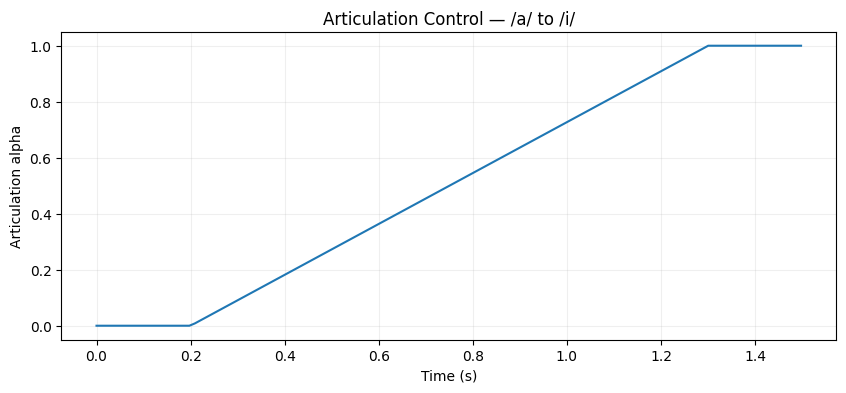

In [ ]:
plt.figure(
  figsize=(10, 4)
)


plt.plot(
  times_a_to_i,
  alpha_a_to_i,
)


plt.xlabel(
  "Time (s)"
)

plt.ylabel(
  "Articulation alpha"
)

plt.title(
  "Articulation Control — /a/ to /i/"
)

plt.ylim(
  -0.05,
  1.05,
)

plt.grid(
  alpha=0.2,
)


plt.show()

## 62. Two-Dimensional Vowel Articulation Space

The previous experiment controlled articulation along a single line:

/a/ ↔ /i/

using one interpolation parameter `alpha`.

The next experiment generalizes this into a two-dimensional control space.

Each vowel is assigned a position using the approximate F1/F2 coordinates estimated earlier from the current recordings.

A point `(F1, F2)` in this space does not directly generate a vocal-tract model.

Instead, its location determines how strongly the five reusable articulation curves contribute to the synthesized articulation.

Therefore:

position in vowel space
→ interpolation weights
→ blended spectral articulation curve
→ same neutral voice carrier

The goal is to create a continuous vowel-like articulation surface rather than five discrete presets.

In [107]:
vowel_space = {
  "a": np.array([
    680.9,
    1224.6,
  ]),

  "e": np.array([
    551.6,
    1717.7,
  ]),

  "i": np.array([
    328.4,
    2180.1,
  ]),

  "o": np.array([
    407.2,
    794.2,
  ]),

  "u": np.array([
    455.9,
    863.6,
  ]),
}

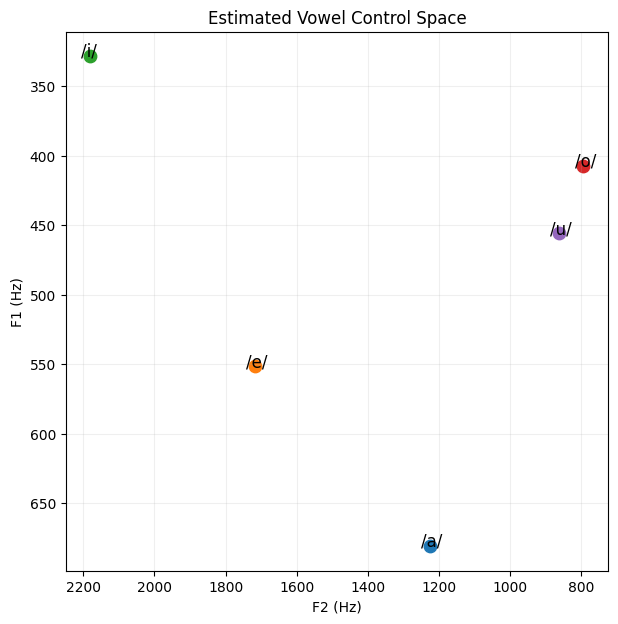

In [108]:
plt.figure(
  figsize=(7, 7)
)


for vowel in vowels:
  f1, f2 = vowel_space[
    vowel
  ]


  plt.scatter(
    f2,
    f1,
    s=80,
  )


  plt.text(
    f2 + 25,
    f1,
    f"/{vowel}/",
    fontsize=12,
  )


plt.xlabel(
  "F2 (Hz)"
)

plt.ylabel(
  "F1 (Hz)"
)

plt.title(
  "Estimated Vowel Control Space"
)


plt.gca().invert_xaxis()

plt.gca().invert_yaxis()

plt.grid(
  alpha=0.2,
)


plt.show()

In [109]:
def compute_vowel_space_weights(
  target_f1,
  target_f2,
  vowel_space,
  power=2.0,
  epsilon=1e-6,
):
  target = np.array([
    target_f1,
    target_f2,
  ])


  raw_weights = {}


  for vowel in vowels:
    vowel_position = vowel_space[
      vowel
    ]


    distance = np.linalg.norm(
      target
      - vowel_position
    )


    if distance < epsilon:
      return {
        current_vowel: (
          1.0
          if current_vowel == vowel
          else 0.0
        )
        for current_vowel in vowels
      }


    raw_weights[
      vowel
    ] = (
      1.0
      / (
        distance
        ** power
      )
    )


  total_weight = sum(
    raw_weights.values()
  )


  weights = {
    vowel: (
      raw_weights[
        vowel
      ]
      / total_weight
    )
    for vowel in vowels
  }


  return weights

In [110]:
def blend_articulation_curves(
  weights,
  articulation_curves,
):
  blended_curve = np.zeros_like(
    articulation_curves[
      vowels[0]
    ]
  )


  for vowel in vowels:
    blended_curve += (
      weights[
        vowel
      ]
      * articulation_curves[
        vowel
      ]
    )


  return blended_curve

In [111]:
for vowel in vowels:
  f1, f2 = vowel_space[
    vowel
  ]


  weights = compute_vowel_space_weights(
    f1,
    f2,
    vowel_space,
  )


  print()
  print(
    f"/{vowel}/ position"
  )

  print(
    {
      key: round(
        value,
        3,
      )
      for key, value
      in weights.items()
    }
  )


/a/ position
{'a': 1.0, 'e': 0.0, 'i': 0.0, 'o': 0.0, 'u': 0.0}

/e/ position
{'a': 0.0, 'e': 1.0, 'i': 0.0, 'o': 0.0, 'u': 0.0}

/i/ position
{'a': 0.0, 'e': 0.0, 'i': 1.0, 'o': 0.0, 'u': 0.0}

/o/ position
{'a': 0.0, 'e': 0.0, 'i': 0.0, 'o': 1.0, 'u': 0.0}

/u/ position
{'a': 0.0, 'e': 0.0, 'i': 0.0, 'o': 0.0, 'u': 1.0}


In [113]:
test_f1 = 500
test_f2 = 1400


test_weights = compute_vowel_space_weights(
  test_f1,
  test_f2,
  vowel_space,
)


test_curve = blend_articulation_curves(
  test_weights,
  articulation_curves_01,
)


test_wave = apply_revowel_articulation(
  carrier_wave,
  carrier_sr,
  freqs_ref_01,
  test_curve,
  strength=1.0,
  max_articulation_db=24,
)


print(
  "1. New point in vowel space"
)

print(
  "F1:",
  test_f1,
  "Hz"
)

print(
  "F2:",
  test_f2,
  "Hz"
)

print(
  "Weights:",
  {
    key: round(
      value,
      3,
    )
    for key, value
    in test_weights.items()
  }
)


display(
  Audio(
    test_wave,
    rate=carrier_sr,
  )
)

1. New point in vowel space
F1: 500 Hz
F2: 1400 Hz
Weights: {'a': np.float64(0.476), 'e': np.float64(0.292), 'i': np.float64(0.047), 'o': np.float64(0.08), 'u': np.float64(0.104)}


In [115]:
test_points = [
  (500, 1400),
  (400, 1500),
  (600, 1000),
  (380, 1100),
]


for index, (
  test_f1,
  test_f2,
) in enumerate(
  test_points,
  start=1,
):
  test_weights = compute_vowel_space_weights(
    test_f1,
    test_f2,
    vowel_space,
  )


  test_curve = blend_articulation_curves(
    test_weights,
    articulation_curves_01,
  )


  test_wave = apply_revowel_articulation(
    carrier_wave,
    carrier_sr,
    freqs_ref_01,
    test_curve,
    strength=1.0,
    max_articulation_db=24,
  )


  print()
  print(
    f"{index}. Test point "
    f"(F1={test_f1}, F2={test_f2})"
  )


  print(
    "Weights:",
    {
      key: round(
        value,
        3,
      )
      for key, value
      in test_weights.items()
    }
  )


  display(
    Audio(
      test_wave,
      rate=carrier_sr,
    )
  )


1. Test point (F1=500, F2=1400)
Weights: {'a': np.float64(0.476), 'e': np.float64(0.292), 'i': np.float64(0.047), 'o': np.float64(0.08), 'u': np.float64(0.104)}



2. Test point (F1=400, F2=1500)
Weights: {'a': np.float64(0.237), 'e': np.float64(0.521), 'i': np.float64(0.078), 'o': np.float64(0.074), 'u': np.float64(0.09)}



3. Test point (F1=600, F2=1000)
Weights: {'a': np.float64(0.302), 'e': np.float64(0.033), 'i': np.float64(0.012), 'o': np.float64(0.216), 'u': np.float64(0.437)}



4. Test point (F1=380, F2=1100)
Weights: {'a': np.float64(0.238), 'e': np.float64(0.062), 'i': np.float64(0.022), 'o': np.float64(0.268), 'u': np.float64(0.41)}


## 69. Dynamic Two-Dimensional Articulation Path

The static tests showed that intermediate positions in the vowel-control space produce smooth and perceptually coherent vocal articulations.

The next experiment moves continuously through this two-dimensional space over time.

Instead of one scalar control:

alpha(t)

we now use two control trajectories:

F1_control(t)
F2_control(t)

These coordinates determine interpolation weights among the five reusable vowel articulation curves.

The coordinates are used as control geometry.

They should not yet be interpreted as exact physical output formant frequencies.

The first path is:

/a/ → /e/ → /i/ → /u/ → /o/ → /a/

using the same vowel-normalized carrier.

In [116]:
def make_vowel_space_path(
  times,
  vowel_sequence,
  vowel_space,
):
  waypoint_times = np.linspace(
    times[0],
    times[-1],
    len(vowel_sequence),
  )


  waypoint_f1 = np.array([
    vowel_space[vowel][0]
    for vowel in vowel_sequence
  ])


  waypoint_f2 = np.array([
    vowel_space[vowel][1]
    for vowel in vowel_sequence
  ])


  f1_t = np.interp(
    times,
    waypoint_times,
    waypoint_f1,
  )


  f2_t = np.interp(
    times,
    waypoint_times,
    waypoint_f2,
  )


  return (
    f1_t,
    f2_t,
    waypoint_times,
  )

In [117]:
def apply_dynamic_vowel_space_path(
  carrier_wave,
  sr,
  articulation_freqs,
  articulation_curves,
  vowel_space,
  vowel_sequence,
  power=2.0,
  max_articulation_db=24,
  n_fft=4096,
  hop_length=512,
):
  stft = librosa.stft(
    carrier_wave.astype(float),
    n_fft=n_fft,
    hop_length=hop_length,
    window="hann",
  )


  stft_freqs = librosa.fft_frequencies(
    sr=sr,
    n_fft=n_fft,
  )


  n_frames = stft.shape[1]


  times = (
    np.arange(n_frames)
    * hop_length
    / sr
  )


  (
    f1_t,
    f2_t,
    waypoint_times,
  ) = make_vowel_space_path(
    times,
    vowel_sequence,
    vowel_space,
  )


  vowel_positions = np.stack(
    [
      vowel_space[vowel]
      for vowel in vowels
    ],
    axis=0,
  )


  target_positions = np.column_stack([
    f1_t,
    f2_t,
  ])


  distances = np.linalg.norm(
    target_positions[:, None, :]
    - vowel_positions[None, :, :],
    axis=2,
  )


  raw_weights = (
    1.0
    / (
      distances
      + 1e-6
    )
    ** power
  )


  weights = (
    raw_weights
    / np.sum(
      raw_weights,
      axis=1,
      keepdims=True,
    )
  )


  vowel_curve_matrix = np.stack(
    [
      np.interp(
        stft_freqs,
        articulation_freqs,
        articulation_curves[
          vowel
        ],
        left=0.0,
        right=0.0,
      )
      for vowel in vowels
    ],
    axis=0,
  )


  articulation_db = (
    vowel_curve_matrix.T
    @ weights.T
  )


  articulation_db = np.clip(
    articulation_db,
    -max_articulation_db,
    max_articulation_db,
  )


  gain = (
    10
    ** (
      articulation_db
      / 20
    )
  )


  articulated_stft = (
    stft
    * gain
  )


  articulated_wave = librosa.istft(
    articulated_stft,
    hop_length=hop_length,
    window="hann",
    length=len(
      carrier_wave
    ),
  )


  articulated_wave = match_rms(
    carrier_wave,
    articulated_wave,
  )


  return (
    articulated_wave,
    times,
    f1_t,
    f2_t,
    weights,
    waypoint_times,
  )

In [118]:
vowel_sequence = [
  "a",
  "e",
  "i",
  "u",
  "o",
  "a",
]


(
  vowel_space_morph,
  vowel_space_times,
  vowel_space_f1,
  vowel_space_f2,
  vowel_space_weights,
  vowel_space_waypoint_times,
) = apply_dynamic_vowel_space_path(
  carrier_wave,
  carrier_sr,
  freqs_ref_01,
  articulation_curves_01,
  vowel_space,
  vowel_sequence,
  power=2.0,
  max_articulation_db=24,
)

In [119]:
print(
  "1. Dynamic 2D vowel-space path"
)

print(
  "/a/ → /e/ → /i/ → /u/ → /o/ → /a/"
)


display(
  Audio(
    vowel_space_morph,
    rate=carrier_sr,
  )
)

1. Dynamic 2D vowel-space path
/a/ → /e/ → /i/ → /u/ → /o/ → /a/


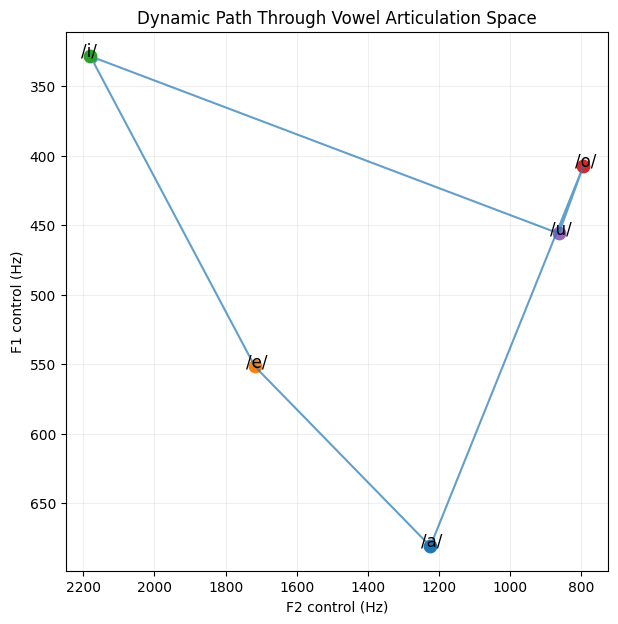

In [120]:
plt.figure(
  figsize=(7, 7)
)


for vowel in vowels:
  f1, f2 = vowel_space[
    vowel
  ]


  plt.scatter(
    f2,
    f1,
    s=80,
  )


  plt.text(
    f2 + 25,
    f1,
    f"/{vowel}/",
    fontsize=12,
  )


plt.plot(
  vowel_space_f2,
  vowel_space_f1,
  alpha=0.7,
)


plt.xlabel(
  "F2 control (Hz)"
)

plt.ylabel(
  "F1 control (Hz)"
)

plt.title(
  "Dynamic Path Through Vowel Articulation Space"
)


plt.gca().invert_xaxis()

plt.gca().invert_yaxis()

plt.grid(
  alpha=0.2,
)


plt.show()

## 74. Interactive XY Vowel Pad

The articulation surface can now be controlled directly with a two-dimensional pad.

The horizontal and vertical coordinates are based on the estimated F1/F2 vowel geometry.

However, F1 and F2 have very different numerical ranges in Hz.

Therefore the interpolation distance is calculated in a normalized coordinate system so that one axis does not dominate simply because its values are numerically larger.

The pad behaves as follows:

- drag or click to choose an articulation position,
- the marker moves immediately,
- releasing the pointer synthesizes the selected articulation,
- the same vowel-normalized human carrier is used at every position.

This is an interactive prototype, not yet a real-time synthesizer.

Audio is regenerated in Python after each selected position.

In [121]:
def compute_vowel_space_weights_normalized(
  target_f1,
  target_f2,
  vowel_space,
  power=2.0,
  epsilon=1e-6,
):
  vowel_positions = np.stack(
    [
      vowel_space[vowel]
      for vowel in vowels
    ],
    axis=0,
  )


  f1_min = np.min(
    vowel_positions[:, 0]
  )

  f1_max = np.max(
    vowel_positions[:, 0]
  )


  f2_min = np.min(
    vowel_positions[:, 1]
  )

  f2_max = np.max(
    vowel_positions[:, 1]
  )


  f1_scale = (
    f1_max
    - f1_min
  )


  f2_scale = (
    f2_max
    - f2_min
  )


  target = np.array([
    target_f1,
    target_f2,
  ])


  raw_weights = {}


  for vowel in vowels:
    vowel_f1, vowel_f2 = (
      vowel_space[
        vowel
      ]
    )


    distance = np.sqrt(
      (
        (
          target_f1
          - vowel_f1
        )
        / f1_scale
      ) ** 2
      +
      (
        (
          target_f2
          - vowel_f2
        )
        / f2_scale
      ) ** 2
    )


    if distance < epsilon:
      return {
        current_vowel: (
          1.0
          if current_vowel == vowel
          else 0.0
        )
        for current_vowel in vowels
      }


    raw_weights[
      vowel
    ] = (
      1.0
      / (
        distance
        ** power
      )
    )


  total_weight = sum(
    raw_weights.values()
  )


  weights = {
    vowel: (
      raw_weights[
        vowel
      ]
      / total_weight
    )
    for vowel in vowels
  }


  return weights

In [122]:
def synthesize_vowel_space_point(
  target_f1,
  target_f2,
  power=2.0,
):
  weights = (
    compute_vowel_space_weights_normalized(
      target_f1,
      target_f2,
      vowel_space,
      power=power,
    )
  )


  articulation_curve = (
    blend_articulation_curves(
      weights,
      articulation_curves_01,
    )
  )


  wave = apply_revowel_articulation(
    carrier_wave,
    carrier_sr,
    freqs_ref_01,
    articulation_curve,
    strength=1.0,
    max_articulation_db=24,
  )


  return (
    wave,
    weights,
    articulation_curve,
  )

In [126]:
import io
import base64

from google.colab import output
from IPython.display import JSON


def xy_pad_synthesize_callback(
  target_f1,
  target_f2,
):
  (
    wave,
    weights,
    _,
  ) = synthesize_vowel_space_point(
    target_f1,
    target_f2,
  )


  wav_buffer = io.BytesIO()


  sf.write(
    wav_buffer,
    wave,
    carrier_sr,
    format="WAV",
  )


  wav_base64 = base64.b64encode(
    wav_buffer.getvalue()
  ).decode(
    "ascii"
  )


  rounded_weights = {
    vowel: round(
      float(
        weights[
          vowel
        ]
      ),
      3,
    )
    for vowel in vowels
  }


  result = {
    "audio": wav_base64,

    "f1": round(
      float(
        target_f1
      ),
      1,
    ),

    "f2": round(
      float(
        target_f2
      ),
      1,
    ),

    "weights": rounded_weights,
  }


  return JSON(
    result
  )


output.register_callback(
  "devowel.synthesize_xy",
  xy_pad_synthesize_callback,
)


print(
  "XY pad synthesis callback registered."
)

XY pad synthesis callback registered.


In [127]:
from IPython.display import HTML

import json


vowel_data_js = {
  vowel: {
    "f1": float(
      vowel_space[
        vowel
      ][0]
    ),
    "f2": float(
      vowel_space[
        vowel
      ][1]
    ),
  }
  for vowel in vowels
}


f1_values = [
  vowel_space[vowel][0]
  for vowel in vowels
]

f2_values = [
  vowel_space[vowel][1]
  for vowel in vowels
]


pad_f1_min = (
  min(f1_values)
  - 80
)

pad_f1_max = (
  max(f1_values)
  + 80
)


pad_f2_min = (
  min(f2_values)
  - 180
)

pad_f2_max = (
  max(f2_values)
  + 180
)


vowel_data_json = json.dumps(
  vowel_data_js
)


html = f"""
<div
  id="devowel-pad-container"
  style="
    max-width: 720px;
    font-family: sans-serif;
  "
>

  <h3>
    DeVowel Synth — XY Articulation Pad
  </h3>

  <div
    style="
      margin-bottom: 8px;
      color: #555;
    "
  >
    Drag the point and release to synthesize.
  </div>

  <canvas
    id="devowel-pad"
    width="650"
    height="460"
    style="
      width: 100%;
      max-width: 650px;
      border: 1px solid #888;
      border-radius: 8px;
      cursor: crosshair;
      touch-action: none;
    "
  ></canvas>

  <div
    id="devowel-position"
    style="
      margin-top: 10px;
      font-family: monospace;
    "
  ></div>

  <div
    id="devowel-weights"
    style="
      margin-top: 5px;
      font-family: monospace;
    "
  ></div>

  <div
    id="devowel-status"
    style="
      margin-top: 8px;
      color: #666;
    "
  >
    Ready.
  </div>

  <audio
    id="devowel-audio"
    controls
    style="
      width: 100%;
      max-width: 650px;
      margin-top: 12px;
    "
  ></audio>

</div>


<script>
(() => {{

  const canvas =
    document.getElementById(
      "devowel-pad"
    );

  const ctx =
    canvas.getContext(
      "2d"
    );

  const positionText =
    document.getElementById(
      "devowel-position"
    );

  const weightText =
    document.getElementById(
      "devowel-weights"
    );

  const statusText =
    document.getElementById(
      "devowel-status"
    );

  const audio =
    document.getElementById(
      "devowel-audio"
    );


  const vowels =
    {vowel_data_json};


  const f1Min =
    {float(pad_f1_min)};

  const f1Max =
    {float(pad_f1_max)};

  const f2Min =
    {float(pad_f2_min)};

  const f2Max =
    {float(pad_f2_max)};


  const margin = 40;


  let currentX =
    canvas.width / 2;

  let currentY =
    canvas.height / 2;


  let dragging = false;

  let synthesizing = false;


  function clamp(
    value,
    minimum,
    maximum
  ) {{
    return Math.max(
      minimum,
      Math.min(
        maximum,
        value
      )
    );
  }}


  function xToF2(x) {{
    const normalized =
      (
        x - margin
      )
      /
      (
        canvas.width
        - 2 * margin
      );


    return (
      f2Max
      - normalized
      * (
        f2Max
        - f2Min
      )
    );
  }}


  function yToF1(y) {{
    const normalized =
      (
        y - margin
      )
      /
      (
        canvas.height
        - 2 * margin
      );


    return (
      f1Min
      + normalized
      * (
        f1Max
        - f1Min
      )
    );
  }}


  function f2ToX(f2) {{
    const normalized =
      (
        f2Max - f2
      )
      /
      (
        f2Max - f2Min
      );


    return (
      margin
      + normalized
      * (
        canvas.width
        - 2 * margin
      )
    );
  }}


  function f1ToY(f1) {{
    const normalized =
      (
        f1 - f1Min
      )
      /
      (
        f1Max - f1Min
      );


    return (
      margin
      + normalized
      * (
        canvas.height
        - 2 * margin
      )
    );
  }}


  function draw() {{
    ctx.clearRect(
      0,
      0,
      canvas.width,
      canvas.height
    );


    ctx.strokeStyle =
      "#bbbbbb";

    ctx.lineWidth = 1;


    ctx.strokeRect(
      margin,
      margin,
      canvas.width
        - 2 * margin,
      canvas.height
        - 2 * margin
    );


    ctx.font =
      "16px sans-serif";

    ctx.textAlign =
      "center";

    ctx.textBaseline =
      "middle";


    for (
      const [vowel, position]
      of Object.entries(vowels)
    ) {{
      const x =
        f2ToX(
          position.f2
        );

      const y =
        f1ToY(
          position.f1
        );


      ctx.beginPath();

      ctx.arc(
        x,
        y,
        7,
        0,
        2 * Math.PI
      );


      ctx.fillStyle =
        "#444";

      ctx.fill();


      ctx.fillText(
        "/" + vowel + "/",
        x,
        y - 18
      );
    }}


    ctx.beginPath();

    ctx.arc(
      currentX,
      currentY,
      11,
      0,
      2 * Math.PI
    );


    ctx.fillStyle =
      synthesizing
      ? "#999"
      : "#e85d3f";

    ctx.fill();


    ctx.strokeStyle =
      "#ffffff";

    ctx.lineWidth = 2;

    ctx.stroke();


    const f1 =
      yToF1(
        currentY
      );

    const f2 =
      xToF2(
        currentX
      );


    positionText.textContent =
      "F1 control = "
      + f1.toFixed(1)
      + " Hz    |    "
      + "F2 control = "
      + f2.toFixed(1)
      + " Hz";
  }}


  function getPointerPosition(event) {{
    const rect =
      canvas.getBoundingClientRect();


    const scaleX =
      canvas.width
      / rect.width;

    const scaleY =
      canvas.height
      / rect.height;


    const x =
      (
        event.clientX
        - rect.left
      )
      * scaleX;


    const y =
      (
        event.clientY
        - rect.top
      )
      * scaleY;


    return {{
      x: clamp(
        x,
        margin,
        canvas.width - margin
      ),

      y: clamp(
        y,
        margin,
        canvas.height - margin
      ),
    }};
  }}


  async function synthesizeCurrentPoint() {{

    if (synthesizing) {{
      statusText.textContent =
        "Previous synthesis is still running.";

      return;
    }}


    const f1 =
      yToF1(
        currentY
      );

    const f2 =
      xToF2(
        currentX
      );


    synthesizing = true;

    draw();


    statusText.textContent =
      "Synthesizing...";


    let data;


    // ----------------------------------------
    // Stage 1: Python synthesis
    // ----------------------------------------

    try {{

      const result =
        await google.colab.kernel.invokeFunction(
          "devowel.synthesize_xy",
          [
            f1,
            f2
          ],
          {{}}
        );


      data =
        result.data[
          "application/json"
        ];


      if (!data) {{
        throw new Error(
          "No JSON data returned from Python."
        );
      }}


      if (!data.audio) {{
        throw new Error(
          "Python returned no audio data."
        );
      }}

    }}

    catch (error) {{

      console.error(
        "Python synthesis error:",
        error
      );


      statusText.textContent =
        "Python synthesis failed: "
        + (
          error.message
          || String(error)
        );


      synthesizing = false;

      draw();

      return;
    }}


    // ----------------------------------------
    // Stage 2: Load generated WAV
    // ----------------------------------------

    try {{

      audio.src =
        "data:audio/wav;base64,"
        + data.audio;


      audio.load();


      weightText.textContent =
        "weights = "
        + JSON.stringify(
          data.weights
        );


      statusText.textContent =
        "Audio generated.";

    }}

    catch (error) {{

      console.error(
        "Audio loading error:",
        error
      );


      statusText.textContent =
        "Audio was synthesized, "
        + "but loading failed: "
        + (
          error.message
          || String(error)
        );


      synthesizing = false;

      draw();

      return;
    }}


    // ----------------------------------------
    // Stage 3: Try autoplay separately
    // ----------------------------------------

    try {{

      await audio.play();


      statusText.textContent =
        "Ready — audio generated and playing.";

    }}

    catch (error) {{

      console.warn(
        "Autoplay blocked:",
        error
      );


      statusText.textContent =
        "Audio generated successfully. "
        + "Press Play if autoplay was blocked.";
    }}


    synthesizing = false;

    draw();
  }}


  canvas.addEventListener(
    "pointerdown",
    event => {{

      if (synthesizing) {{
        return;
      }}


      dragging = true;


      canvas.setPointerCapture(
        event.pointerId
      );


      const position =
        getPointerPosition(
          event
        );


      currentX =
        position.x;

      currentY =
        position.y;


      draw();
    }}
  );


  canvas.addEventListener(
    "pointermove",
    event => {{

      if (
        !dragging
        || synthesizing
      ) {{
        return;
      }}


      const position =
        getPointerPosition(
          event
        );


      currentX =
        position.x;

      currentY =
        position.y;


      draw();
    }}
  );


  canvas.addEventListener(
    "pointerup",
    async event => {{

      if (
        !dragging
        || synthesizing
      ) {{
        return;
      }}


      dragging = false;


      const position =
        getPointerPosition(
          event
        );


      currentX =
        position.x;

      currentY =
        position.y;


      draw();


      await synthesizeCurrentPoint();
    }}
  );


  draw();

}})();
</script>
"""


display(
  HTML(
    html
  )
)